# Register B0182 mouse brain

## Functions and imports

In [22]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

import ants

from scipy.ndimage import binary_fill_holes
from skimage.morphology import remove_small_holes
from scipy.ndimage import gaussian_filter
import SimpleITK as sitk
import cv2

In [24]:
import time 

def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def n4_bias_correction(img, bg_mask, shrink_factor: float=15, show: bool=False) -> np.ndarray:
    """
    N4 bias correction for the input image.
    
    Parameters:
    - img: The input image to correct.
    - alpha: The alpha value for contrast adjustment.
    - shrink_factor: The shrink factor for downsampling the image for bias correction.
    - show: Whether to show the intermediate results.
    
    Returns:
    - corrected_image_full_resolution: The bias corrected image.
    """ 
    # Create the brain tissue mask
    bg_mask = bg_mask.astype(np.uint8)
    mask_img = sitk.GetImageFromArray(bg_mask)
    mask_img = sitk.LiThreshold(mask_img, 0, 1)

    # Use the raw image and convert it to float32
    raw_img = sitk.GetImageFromArray(img.copy())
    raw_img = sitk.Cast(raw_img, sitk.sitkFloat32)

    # Downsample it for bias correction
    inputImage = raw_img
    if shrink_factor > 1:
        inputImage = sitk.Shrink( raw_img, [ shrink_factor ] * raw_img.GetDimension() ) #2
        maskImage = sitk.Shrink( mask_img, [ shrink_factor ] * inputImage.GetDimension() ) #3
    else:
        inputImage = raw_img
        maskImage = mask_img

    # Run bias correction
    start_time = time.time()
    bias_corrector = sitk.N4BiasFieldCorrectionImageFilter()
    corrected = bias_corrector.Execute(inputImage, maskImage)
    
    # Apply bias correction to full resolution image
    log_bias_field = bias_corrector.GetLogBiasFieldAsImage(raw_img)
    corrected_image_full_resolution = raw_img / sitk.Exp(log_bias_field)
    end_time = time.time()
    corrected_image_full_resolution = sitk.GetArrayFromImage(corrected_image_full_resolution)
    
    # Show the process if True
    if show:
        print(f"Time taken for bias correction: {end_time - start_time:.2f} seconds")
        
        # Show the brain tissue mask
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(sitk.GetArrayFromImage(mask_img), cmap='gray')
        plt.title(f"Full resolution brain mask")
        plt.subplot(1, 2, 2)
        plt.imshow(sitk.GetArrayFromImage(maskImage), cmap='gray')
        plt.title(f"Downsampled brain mask (shrink factor={shrink_factor})")
        plt.show()
        
        # Show the log bias field
        plt.figure(figsize=(10, 5))
        plt.imshow(sitk.GetArrayFromImage(log_bias_field))
        plt.colorbar()
        plt.title(f"Log bias field")
        plt.show()

        # Show the corrected bias field image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Original raw image")
        plt.subplot(1, 2, 2)
        plt.imshow(corrected_image_full_resolution, cmap='gray')
        plt.title(f"Corrected bias raw image")
        plt.show()

        # Increase the contrast of the corrected image and show side-by-side
        preview_alpha = 0.25
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Original contrast image (alpha={preview_alpha})")
        plt.subplot(1, 2, 2)
        plt.imshow(corrected_image_full_resolution, cmap='gray')
        plt.title(f"Corrected bias contrast image (alpha={preview_alpha})")
        plt.show()
        
    return corrected_image_full_resolution


def show_slice(data: np.ndarray, idx: int, title: str = "") -> None:
    """
    Show a slice of the data.
    
    Parameters:
    - data: The processed data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f = plt.figure(figsize=(10, 5))
    plt.imshow(data[idx, :, :], cmap='gray')
    plt.title(title)
    plt.show()
    f.clear()
    plt.close(f)


def show_2_slices(data1: np.ndarray, idx1: int, segmentation1: np.ndarray, 
                  data2: np.ndarray, idx2: int, segmentation2: np.ndarray = None,
                  cmap1="gray", cmap2="gray",
                  title1: str = "", title2: str = "") -> None:
    """
    Show two slices of the data and segmentation.
    
    Parameters:
    - data: The processed data.
    - segmentation: The segmentation mask.
    - original_data: The original data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f, ax = plt.subplots(1, 2, figsize=(20, 10))
    # Original slice
    ax[0].imshow(data1[idx1, :, :], cmap=cmap1)
    if segmentation1 is not None:
        ax[0].contour(segmentation1[idx1, :, :], levels=[0.5], colors='r')
    ax[0].set_title(title1)
    # Processed slice
    ax[1].imshow(data2[idx2, :, :], cmap=cmap2)
    if segmentation2 is not None:
        ax[1].contour(segmentation2[idx2, :, :], levels=[0.5], colors='r')
    ax[1].set_title(title2)
    plt.show()
    f.clear()
    plt.close(f)
    
    
def show_3_slices(data1: np.ndarray, idx1: int, segmentation1: np.ndarray, 
                  data2: np.ndarray, idx2: int, 
                  data3: np.ndarray, idx3: int,
                  title1: str = "", title2: str = "", title3: str = "") -> None:
    """
    Show three slices of the data and segmentation.
    
    Parameters:
    - data: The processed data.
    - segmentation: The segmentation mask.
    - original_data: The original data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f, ax = plt.subplots(1, 3, figsize=(20, 10))
    # Original slice
    ax[0].imshow(data1[idx1, :, :], cmap='gray')
    ax[0].contour(segmentation1[idx1, :, :], levels=[0.5], colors='r')
    ax[0].set_title(title1)
    # Processed slice
    ax[1].imshow(data2[idx2, :, :], cmap='gray')
    ax[1].set_title(title2)
    # Atlas color segmentation
    ax[2].imshow(data3[idx3, :, :])
    ax[2].set_title(title3)
    plt.show()
    f.clear()
    plt.close(f)

## Load MRI data

In [5]:
data_path = 'data/B0182_brain_25.nii.gz'
ccf_path = "../../CCF_DATA/average_template_25.nii.gz"
segmentation_path = '../../CCF_DATA/annotation_25.nii.gz'

In [28]:
brain = nib.load(data_path).get_fdata()
ccf = nib.load(ccf_path).get_fdata()
segmentation = nib.load(segmentation_path).get_fdata()

brain_contrast = auto_contrast(brain, alpha=0.5)

print("Brain shape: ", brain.shape)
print("CCF shape: ", ccf.shape)
print("Segmentation shape: ", segmentation.shape)

Brain shape:  (300, 322, 523)
CCF shape:  (528, 320, 456)
Segmentation shape:  (528, 320, 456)


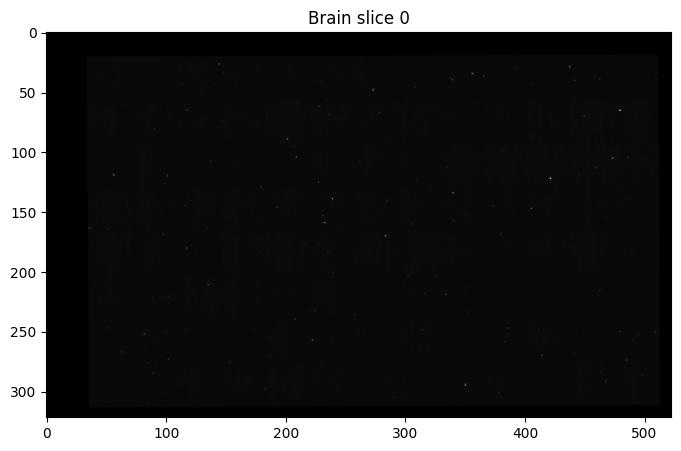

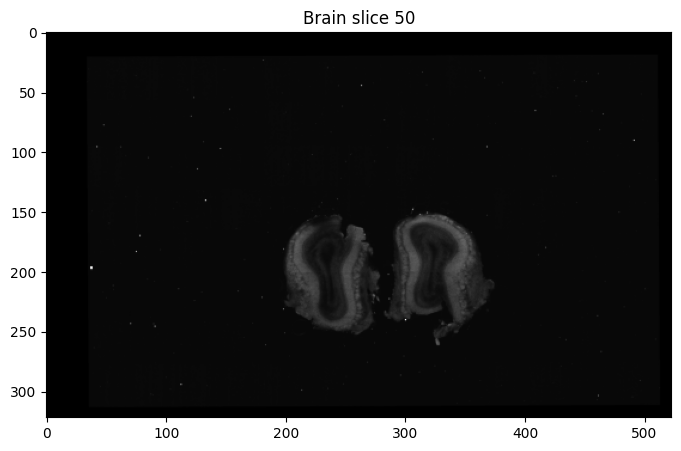

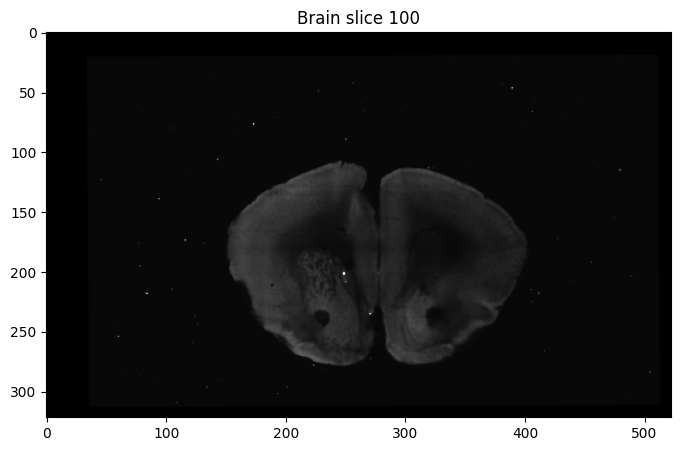

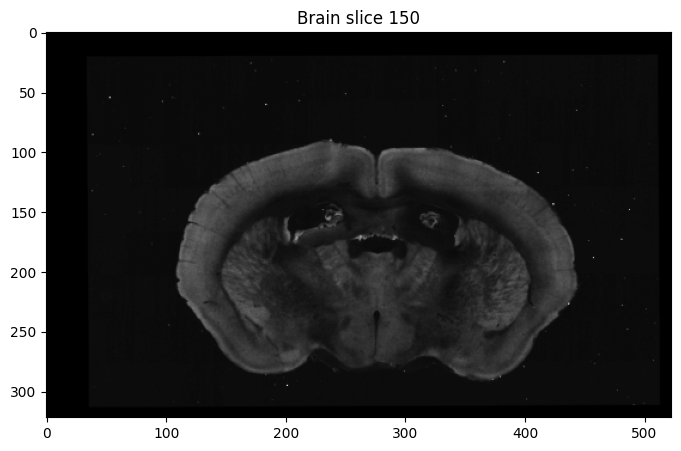

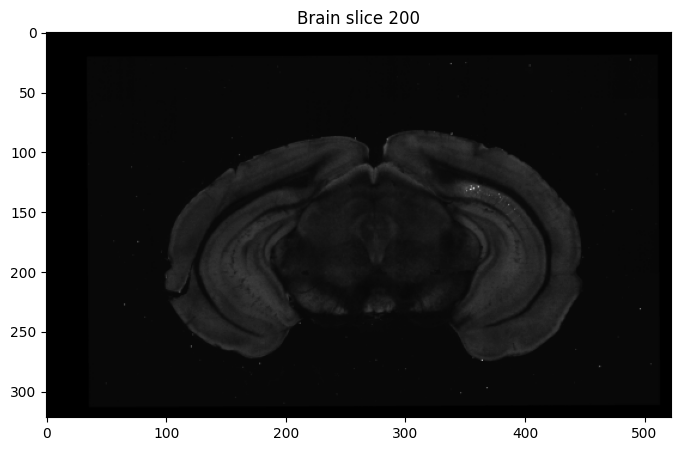

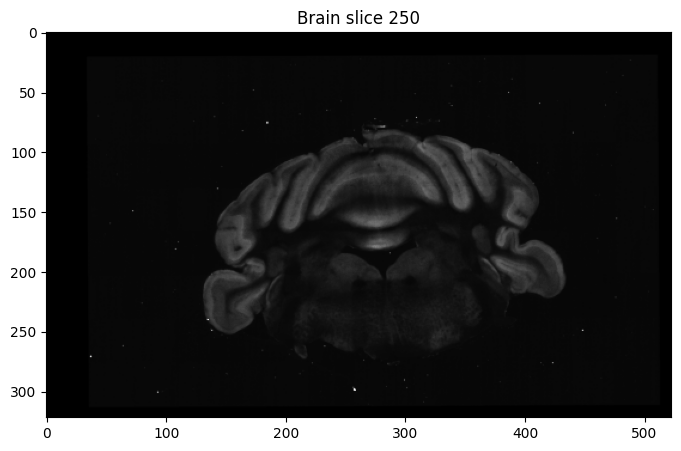

In [29]:
for i in range(0, brain_contrast.shape[0], 50):
    show_slice(brain_contrast, i, title=f"Brain slice {i}")

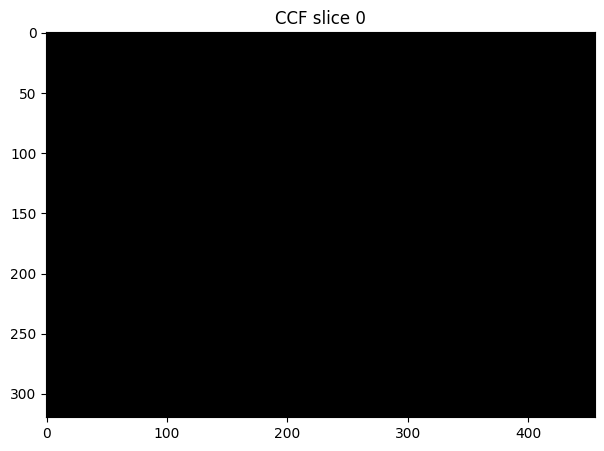

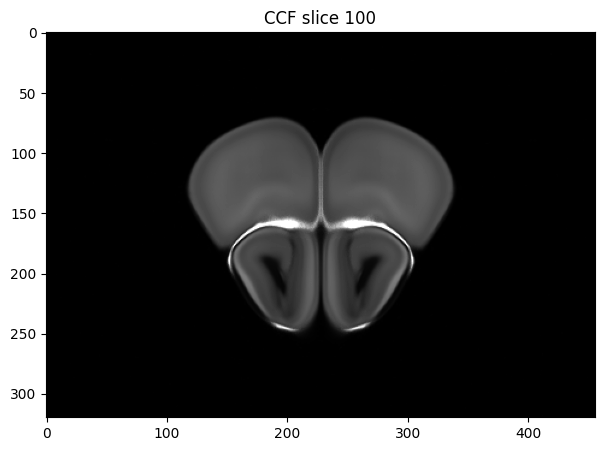

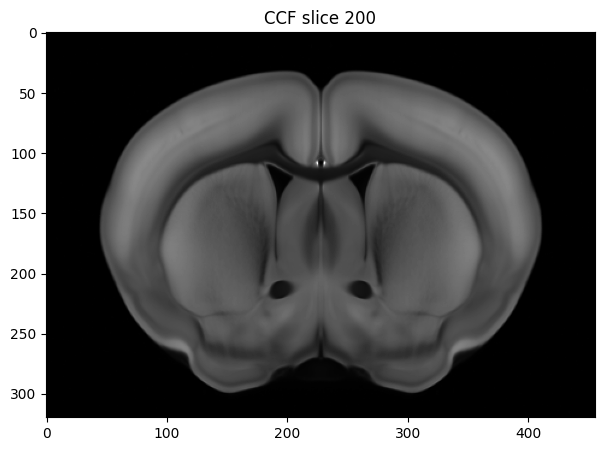

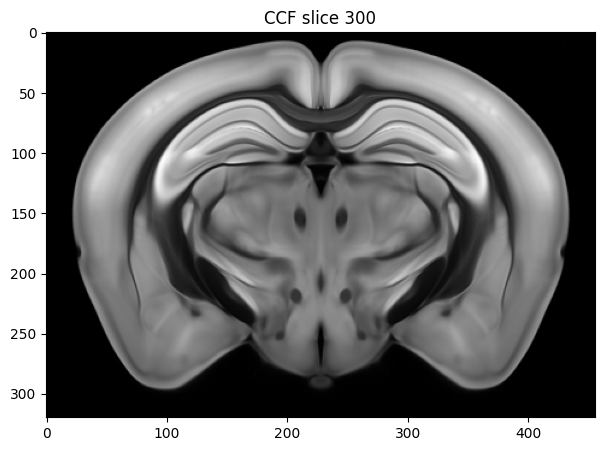

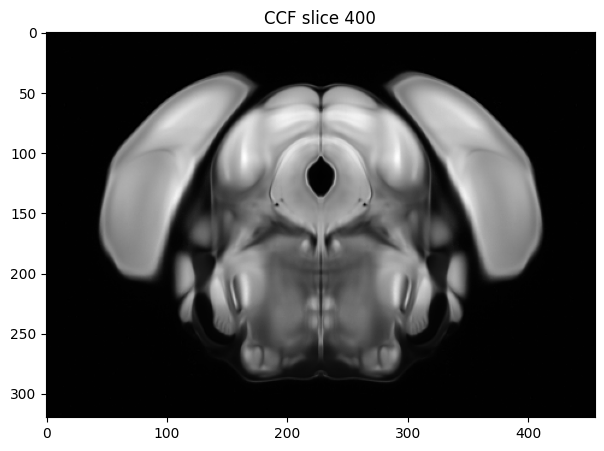

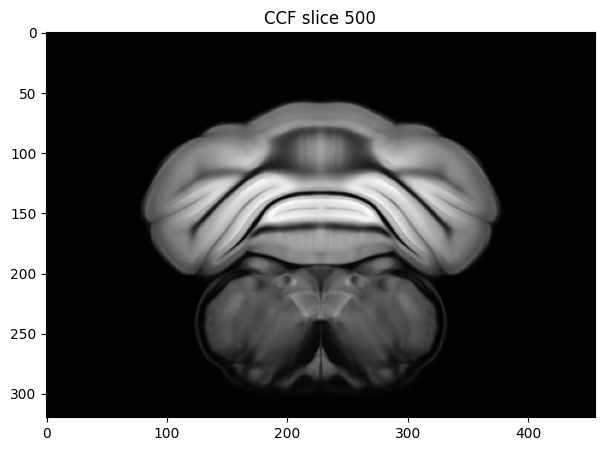

In [14]:
for i in range(0, ccf.shape[0], 100):
    show_slice(ccf, i, title=f"CCF slice {i}")

In [ ]:
# Apply mask to data to remove background
data = n4_bias_correction(original_data.copy(), segmentation, shrink_factor=2, show=False)


Image volume shape: (592, 288, 464)
Image volume data type: float64
Image min value: 0.0
Image max value: 334946153.0224745


Test brain shape:  (528, 320, 456)
Elastix refined shape:  (528, 320, 456)


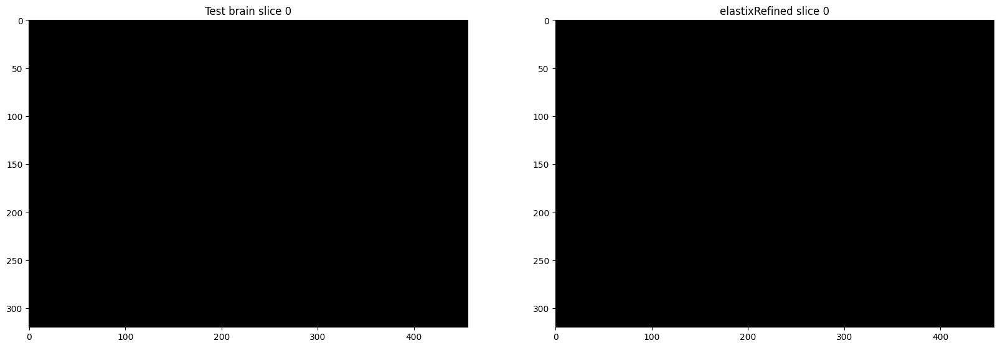

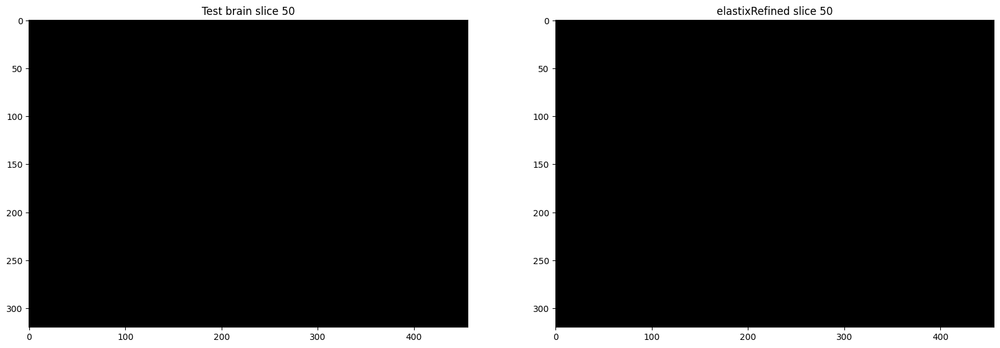

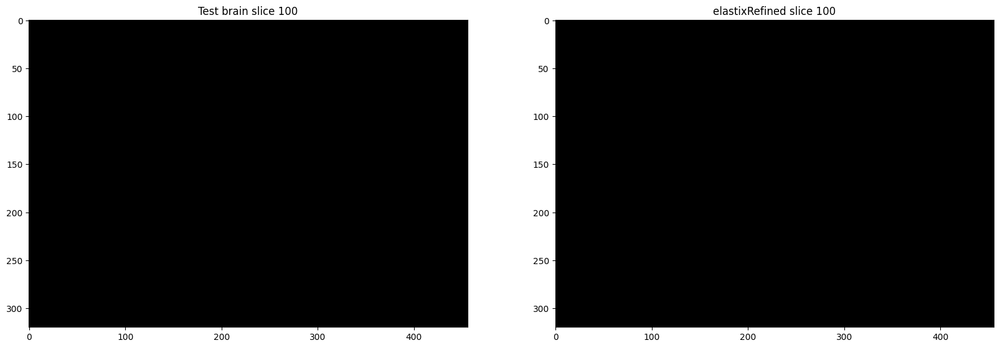

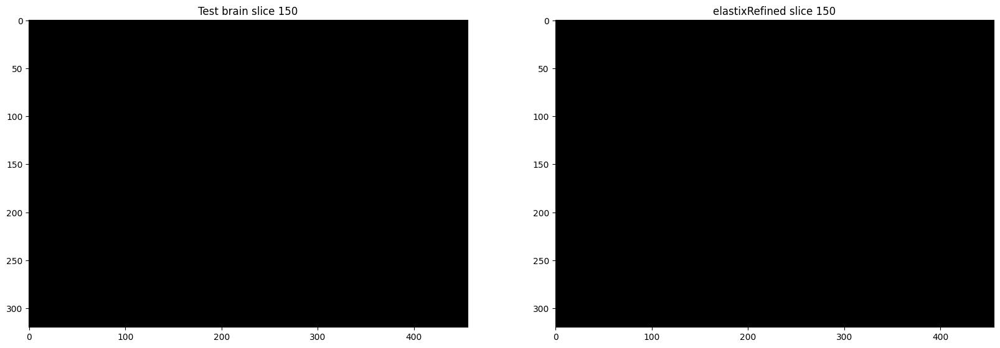

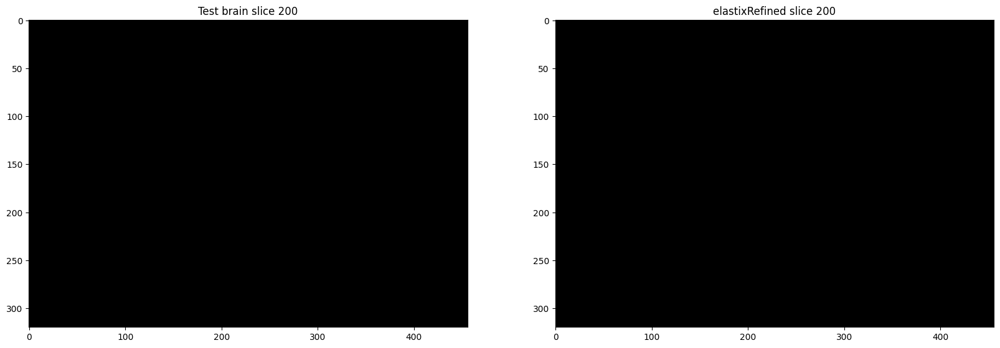

...

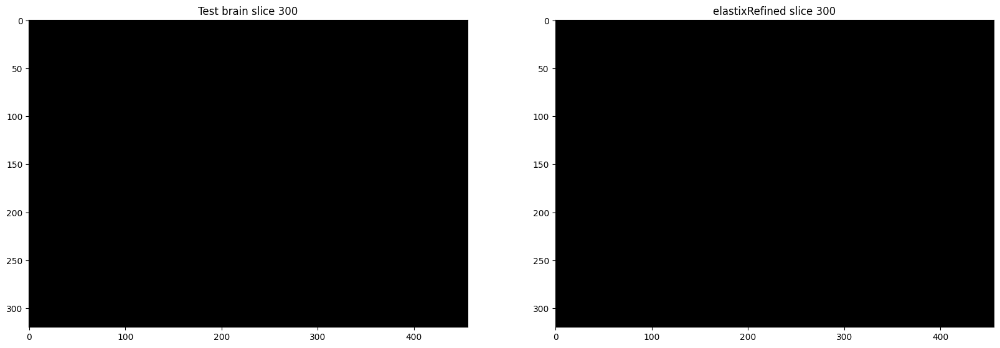

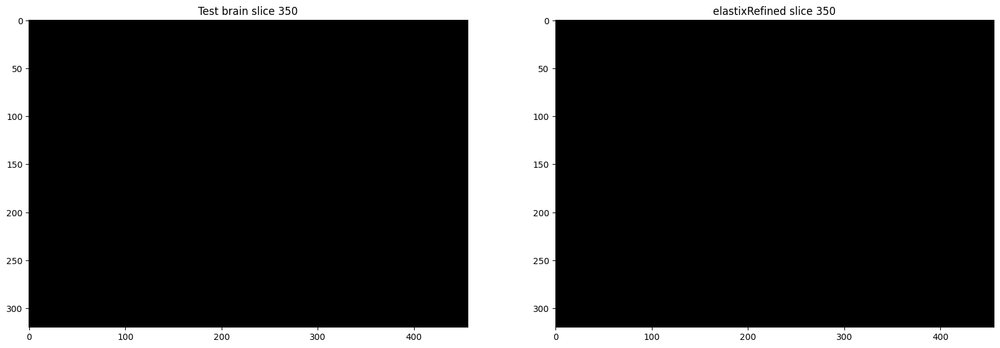

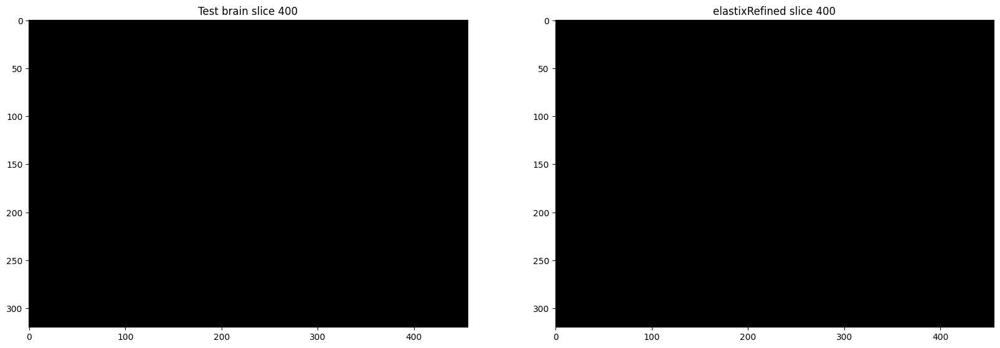

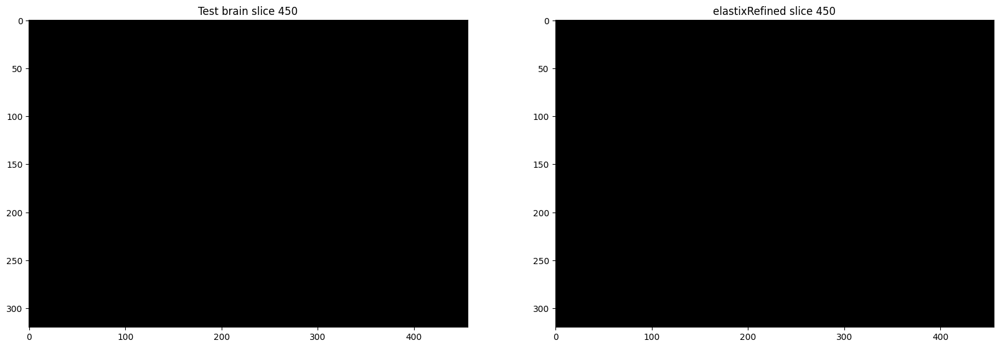

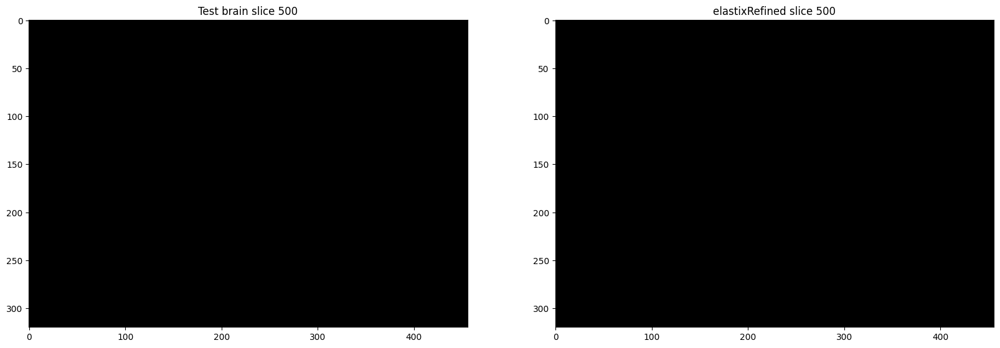

In [41]:
test_path = "data/result.nii"
elastix_refined_path = "data/elastixRefined.nii.gz"

test_brain = nib.load(test_path).get_fdata()
test_brain_contrast = auto_contrast(test_brain, alpha=0.5)
print("Test brain shape: ", test_brain.shape)

elastix_refined = nib.load(elastix_refined_path).get_fdata()
elastix_refined_contrast = auto_contrast(elastix_refined, alpha=10.5)
print("Elastix refined shape: ", elastix_refined.shape)

for i in range(0, test_brain_contrast.shape[0], 50):
    #show_slice(test_brain_contrast, i, title=f"Test brain slice {i}")
    show_2_slices(test_brain_contrast, i, None, 
                  elastix_refined_contrast, i,
                  title1=f"Test brain slice {i}", title2=f"elastixRefined slice {i}")

## Use ANTs registration

In [15]:
output_path = "output/B0182/ants_B0182.nii.gz"

In [17]:
# Run code for ANTs registration
print("Converting arrays to ANTs format...")
moving_image = ants.from_numpy(brain)
fixed_image = ants.from_numpy(ccf)
print()

# Register Degu to atlas
print("Registering data to atlas...")
result = ants.registration(fixed_image, moving_image, type_of_transform = 'SyN' )
print("Saving to", output_path)
# Save Moving image warped to space of fixed image
ants.image_write(result['warpedmovout'], output_path)
# Fixed image warped to space of moving image
#ants.image_write(result['warpedfixout'], output_path)
print("Done!\n")

"""
# Register atlas to Degu
print("Registering atlas to Degu...")
result_inv = ants.registration(moving_image, fixed_image, type_of_transform = 'SyN' )
print("Saving to", output_path_inv)
# Save Moving image warped to space of fixed image
ants.image_write(result_inv['warpedmovout'], output_path_inv)
# Fixed image warped to space of moving image
#ants.image_write(result_inv['warpedfixout'], output_path_inv)
print("Done!")
"""

Converting arrays to ANTs format...

Registering data to atlas...
Saving to output/B0182/ants_B0182.nii.gz
Done!



'\n# Register atlas to Degu\nprint("Registering atlas to Degu...")\nresult_inv = ants.registration(moving_image, fixed_image, type_of_transform = \'SyN\' )\nprint("Saving to", output_path_inv)\n# Save Moving image warped to space of fixed image\nants.image_write(result_inv[\'warpedmovout\'], output_path_inv)\n# Fixed image warped to space of moving image\n#ants.image_write(result_inv[\'warpedfixout\'], output_path_inv)\nprint("Done!")\n'

## Verify shape

In [30]:
registered = nib.load(output_path).get_fdata()
#atlas2degu = nib.load(output_path_inv).get_fdata()
registered_contrast = auto_contrast(registered, alpha=0.5)

print("Registered brain shape:", registered.shape)
#print("Atlas to degu shape:", atlas2degu.shape)

Registered brain shape: (528, 320, 456)


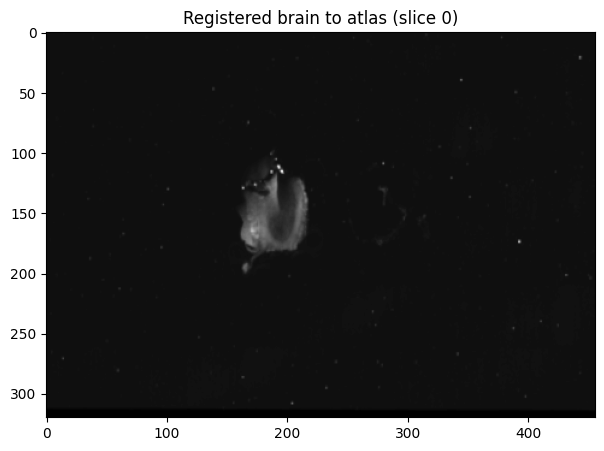

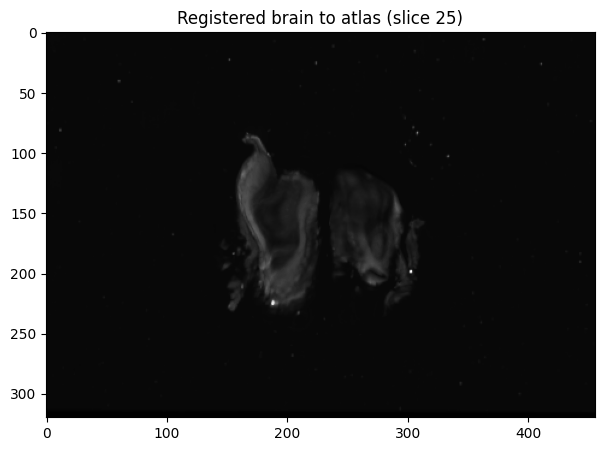

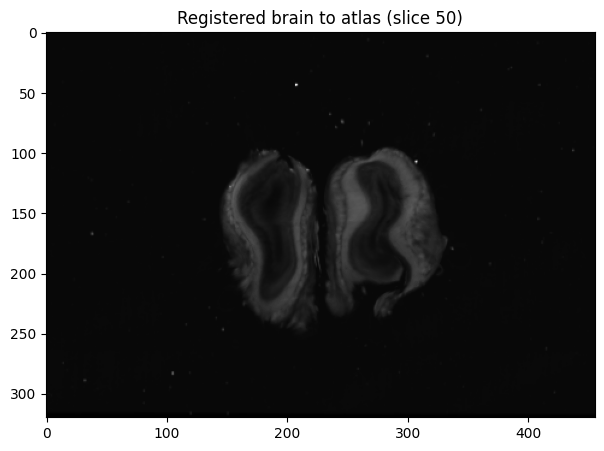

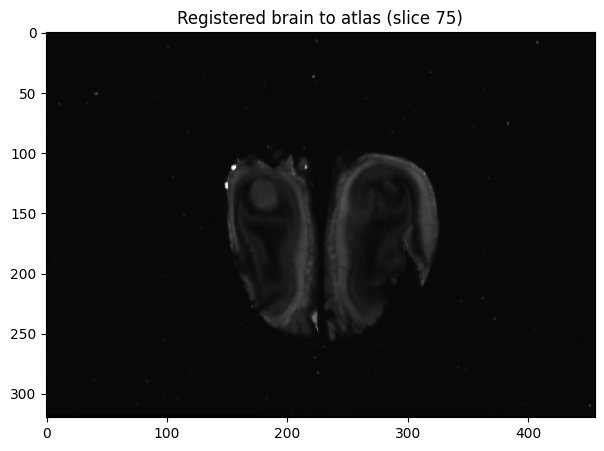

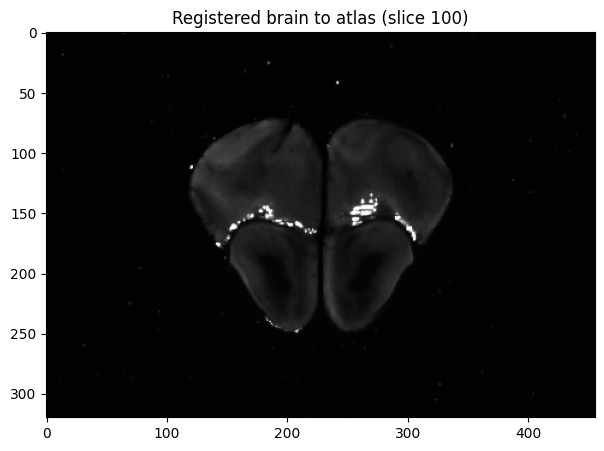

...

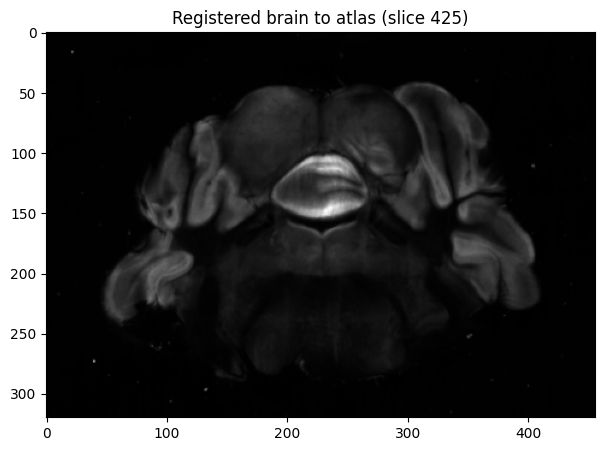

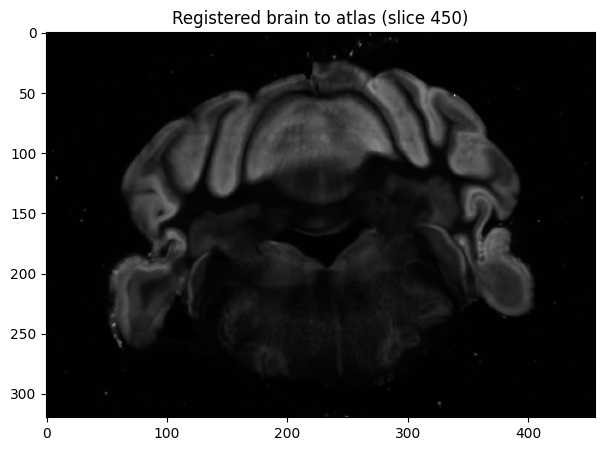

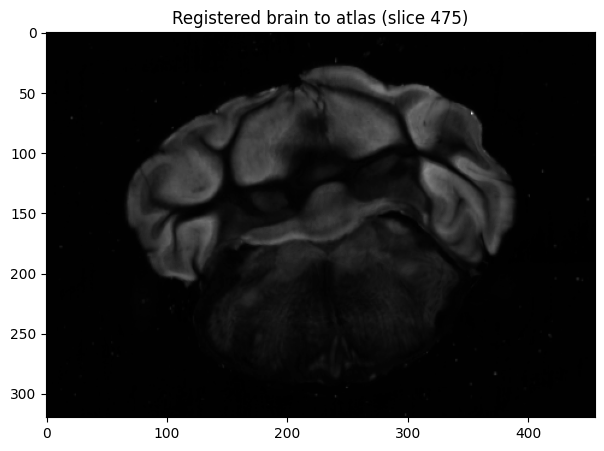

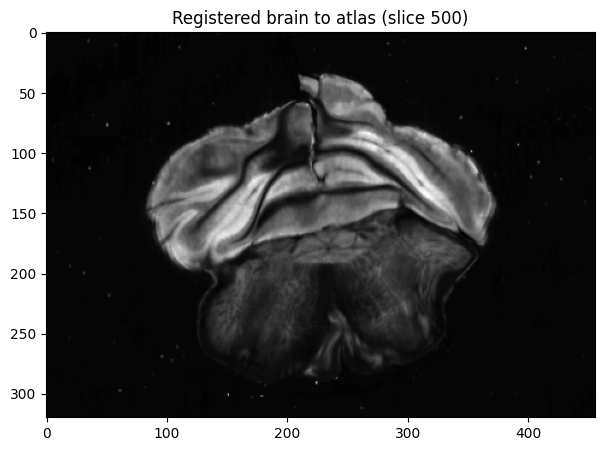

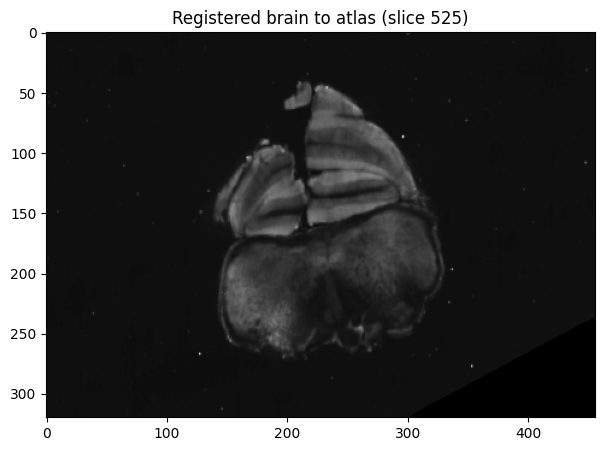

In [31]:
# Show degu to atlas registration ANTs
for i in range(0, registered_contrast.shape[0], 25):
    show_slice(registered_contrast, i, title=f"Registered brain to atlas (slice {i})")

## Show Laplacian registered output

In [13]:
laplacian_degu2atlas_path = "output/Degu-314/laplacian/laplacian_degu_to_atlas_314.nii.gz"
laplacian_atlas2degu_path = "output/Degu-314/laplacian/laplacian_atlas_to_degu_314.nii.gz"

In [14]:
laplacian_degu2atlas = nib.load(laplacian_degu2atlas_path).get_fdata()
laplacian_atlas2degu = nib.load(laplacian_atlas2degu_path).get_fdata()

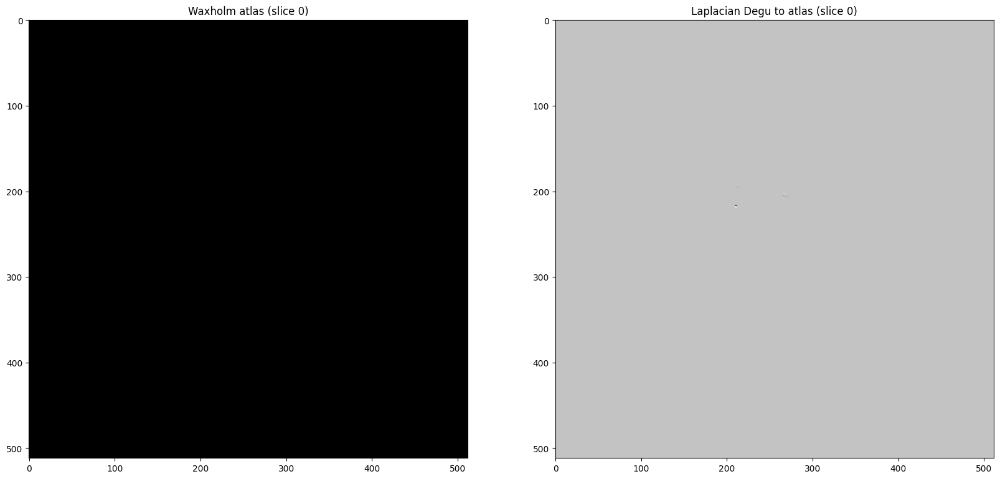

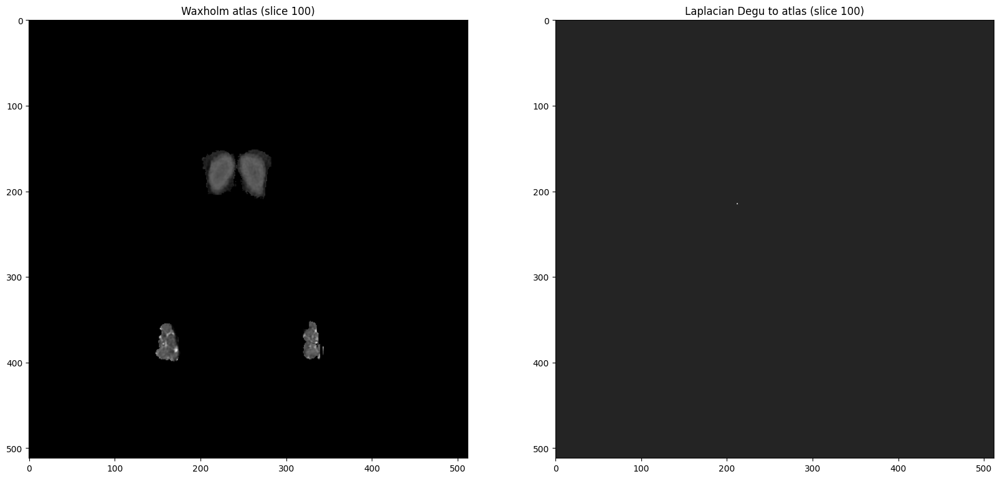

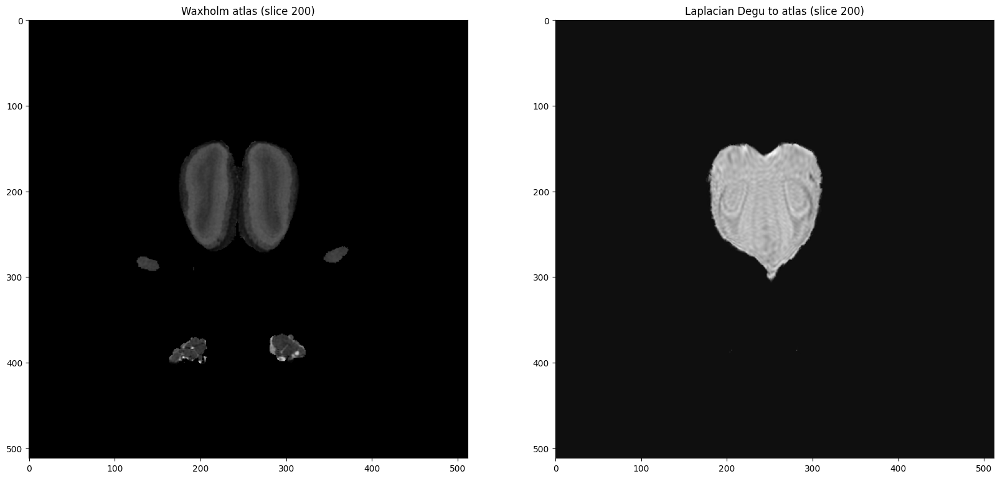

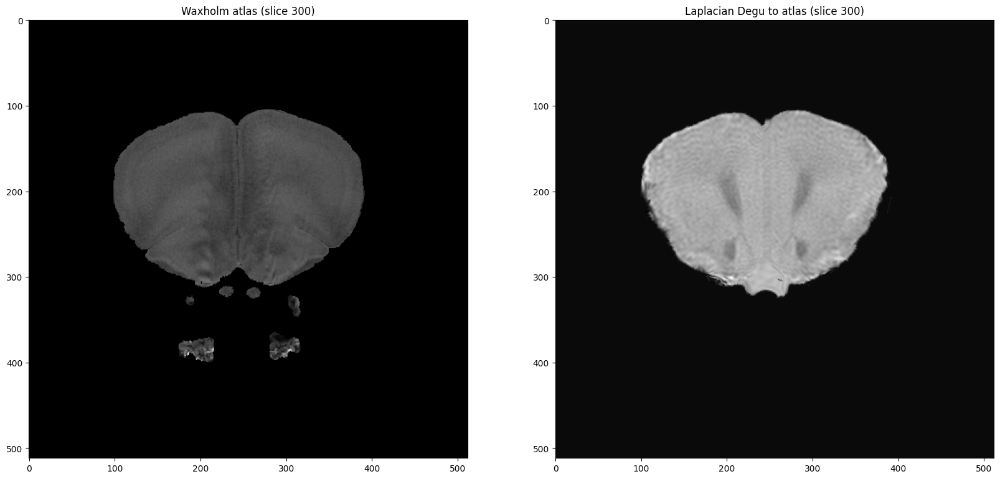

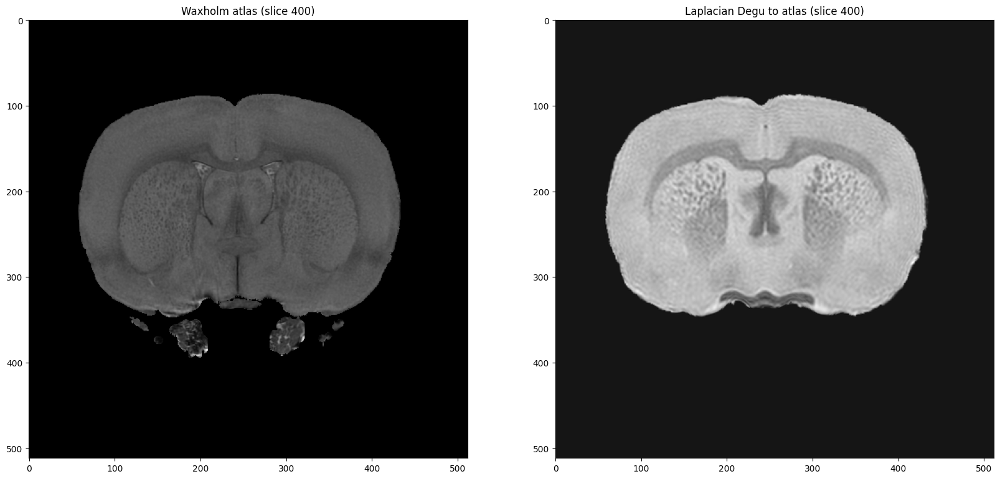

...

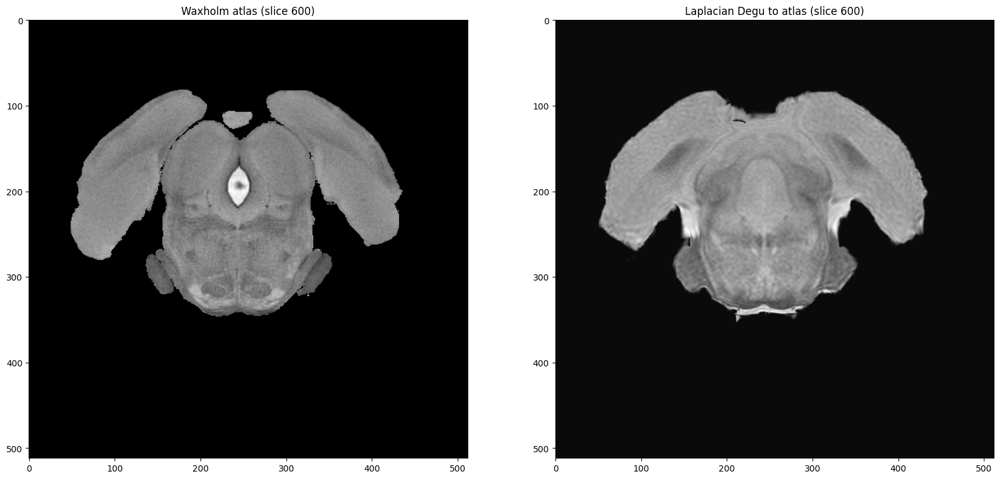

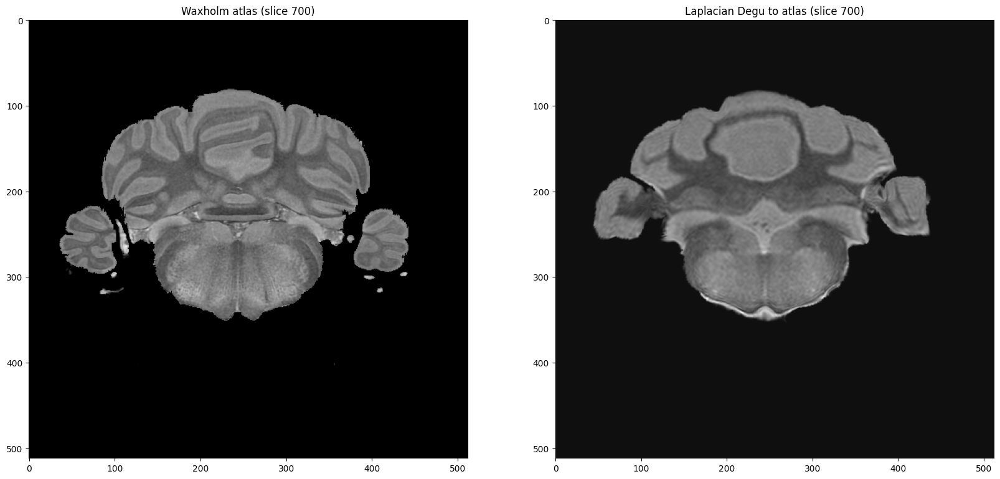

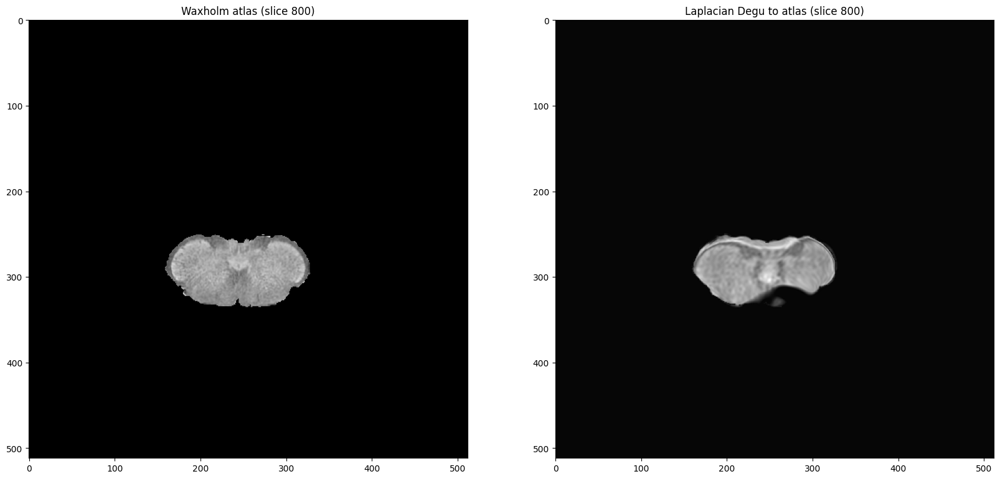

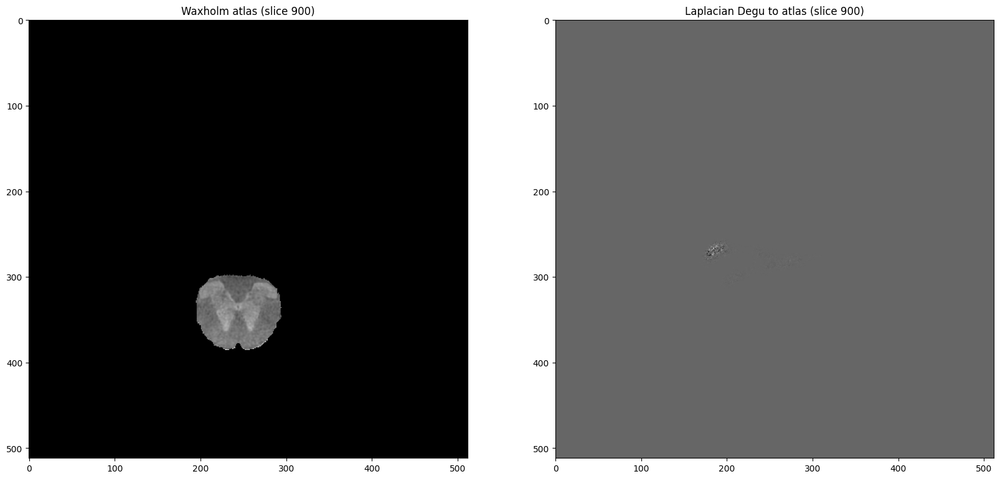

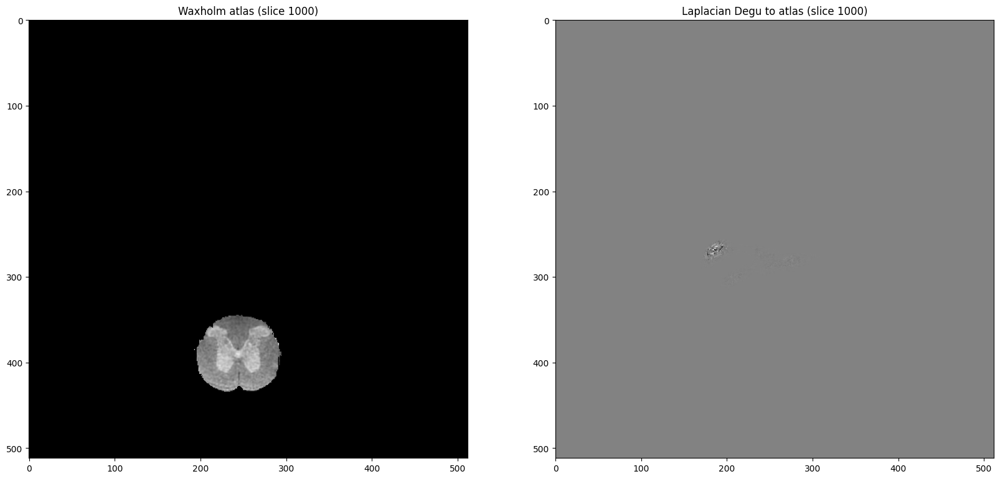

In [ ]:
# Degu to atlas
for i in range(0, laplacian_degu2atlas.shape[0], 100):
    #show_slice(laplacian_degu2atlas, i, title=f"Laplacian Degu to atlas (slice {i})")
    show_2_slices(atlas_data, i, None, laplacian_degu2atlas, i,
                  title1=f"Waxholm atlas (slice {i})",
                  title2=f"Laplacian Degu to atlas (slice {i})")

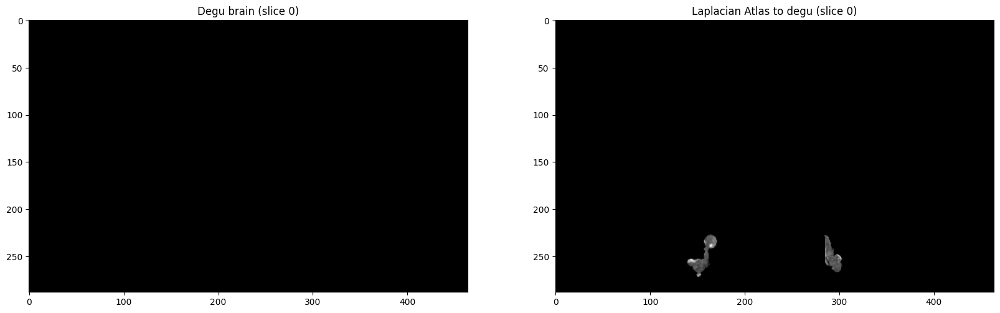

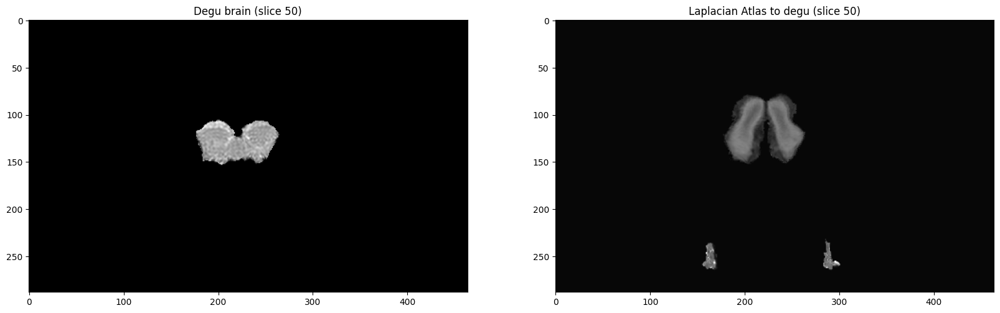

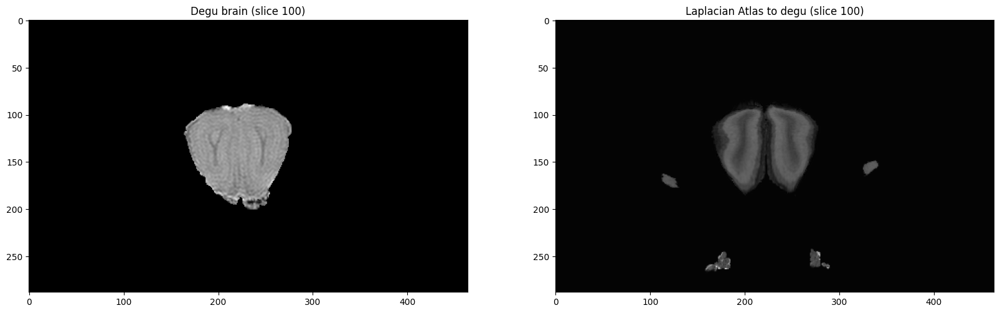

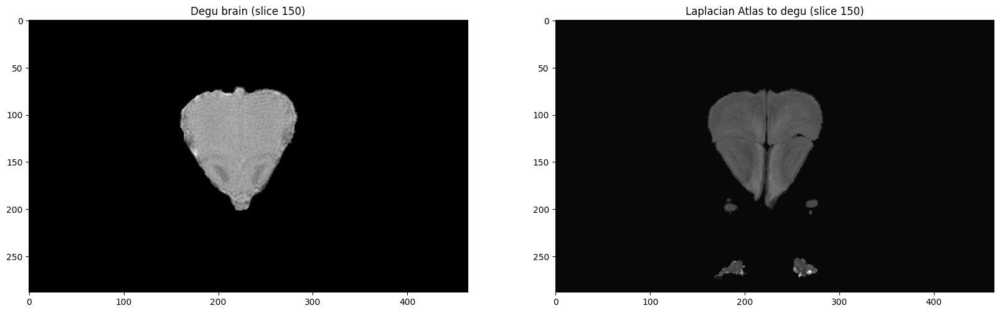

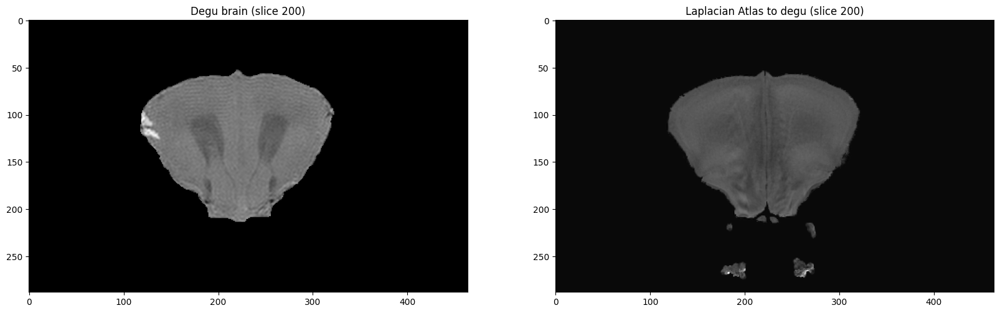

...

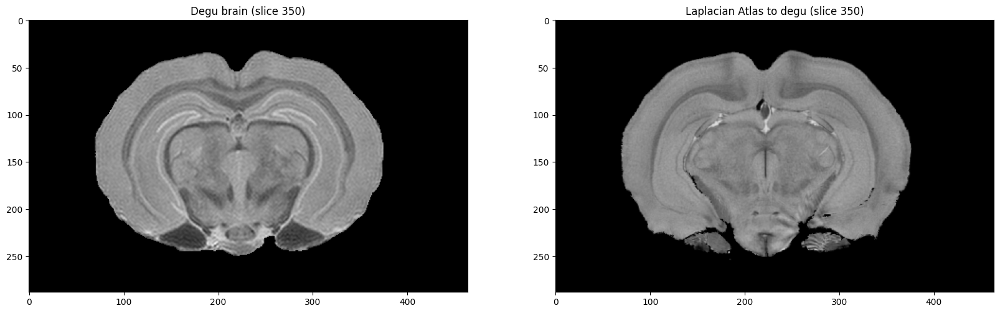

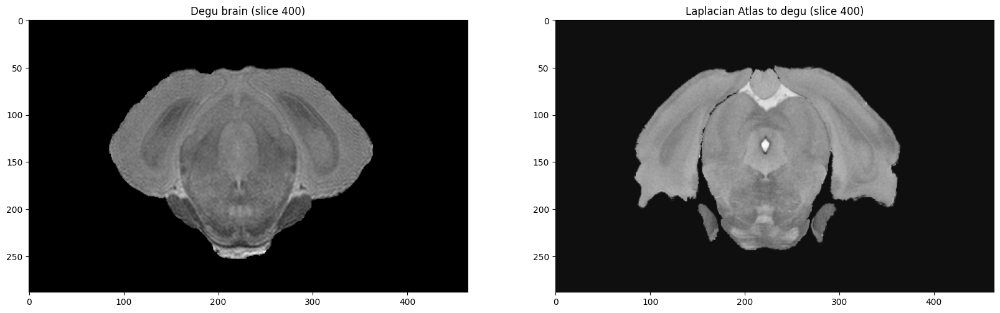

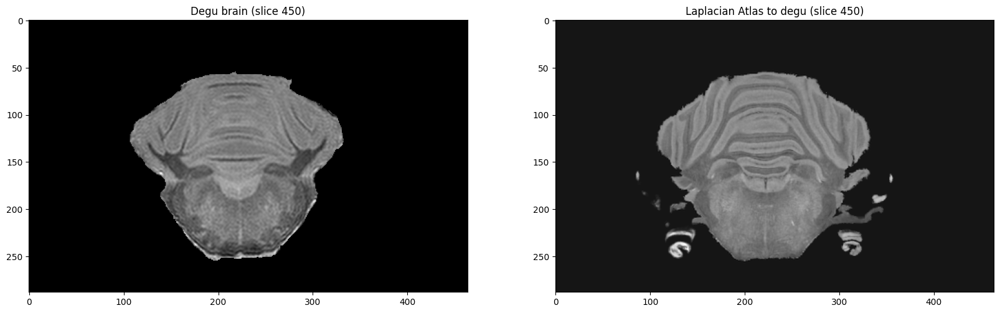

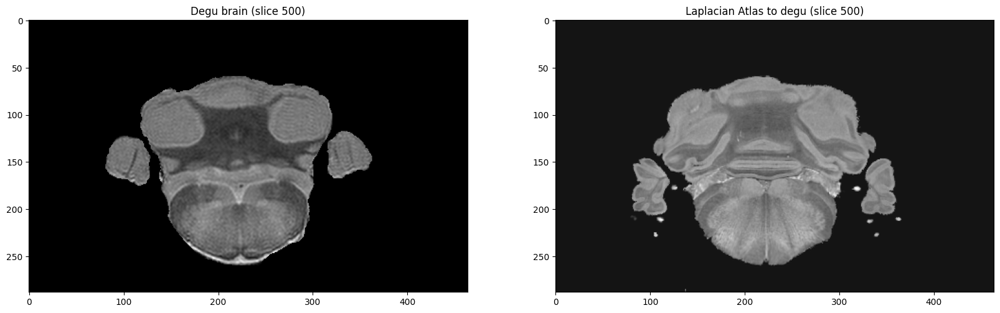

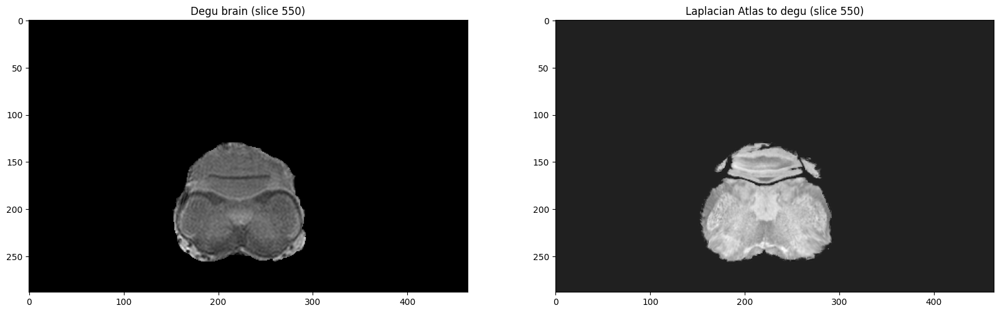

In [ ]:
for i in range(0, laplacian_atlas2degu.shape[0], 50):
    #show_slice(laplacian_atlas2degu, i, title=f"Laplacian Atlas to degu (slice {i})")
    show_2_slices(data, i, None, laplacian_atlas2degu, i,
                  title1=f"Degu brain (slice {i})",
                  title2=f"Laplacian Atlas to degu (slice {i})")

## Show segmentations

### Degu to atlas

Unique values in atlas_label at slice  0 : [0.]


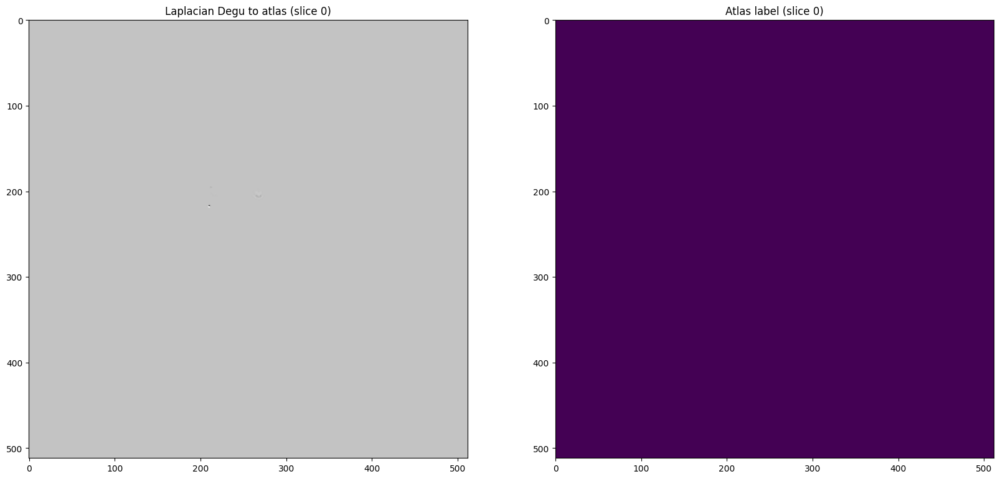

Unique values in atlas_label at slice  50 : [ 0. 76.]


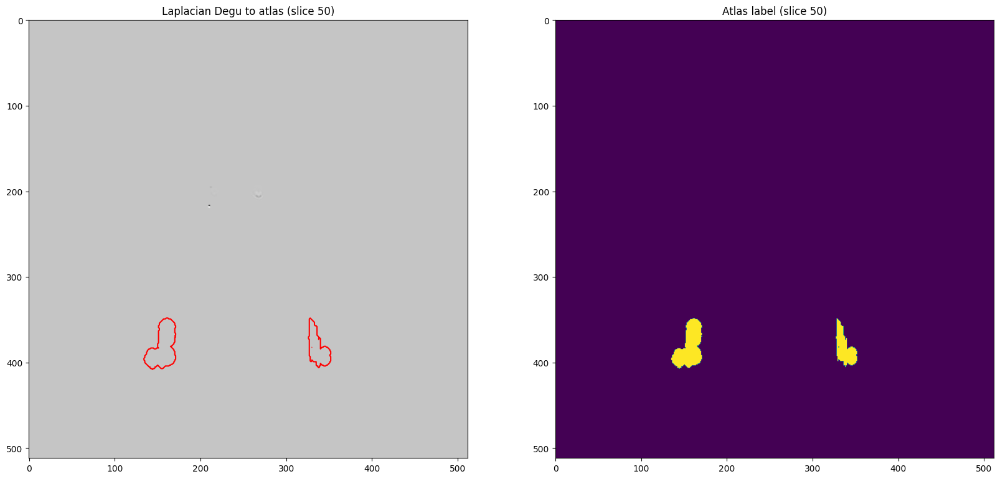

Unique values in atlas_label at slice  100 : [ 0. 65. 66. 76.]


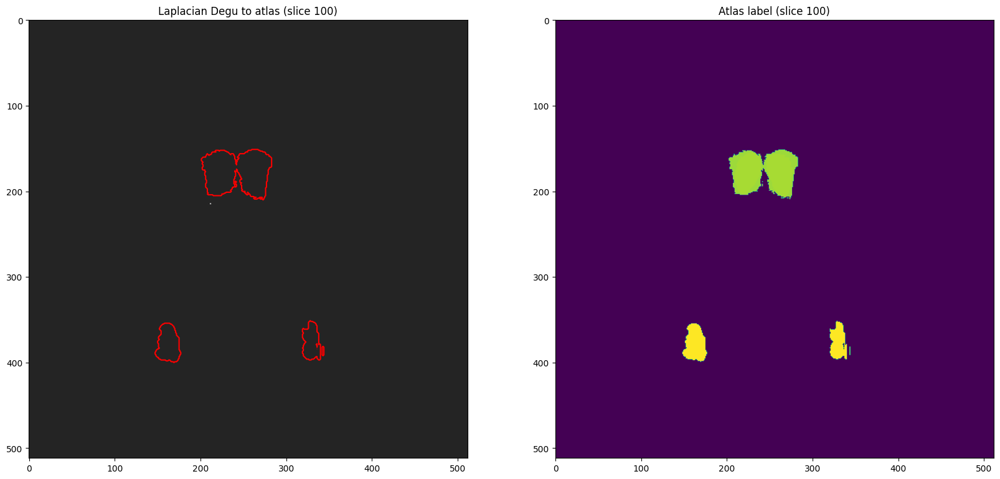

Unique values in atlas_label at slice  150 : [ 0. 41. 65. 66. 76.]


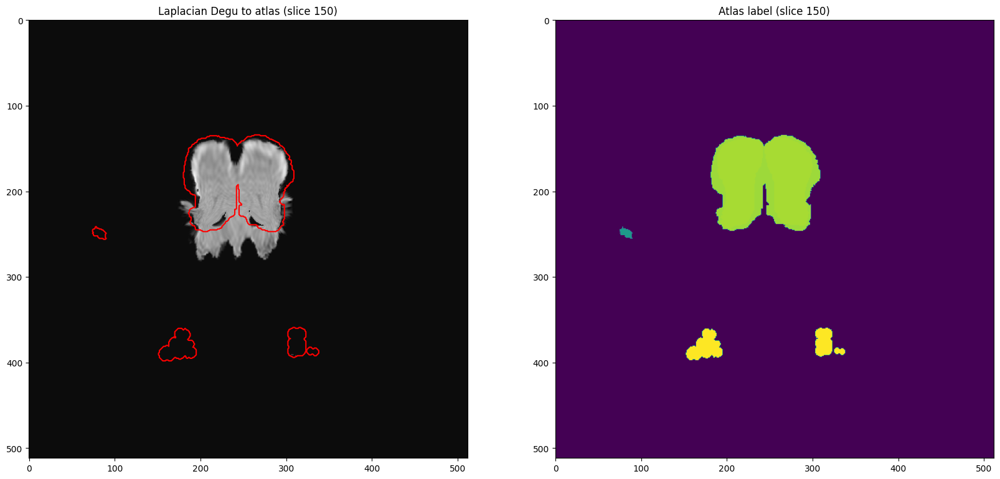

Unique values in atlas_label at slice  200 : [ 0. 41. 64. 65. 66. 76.]


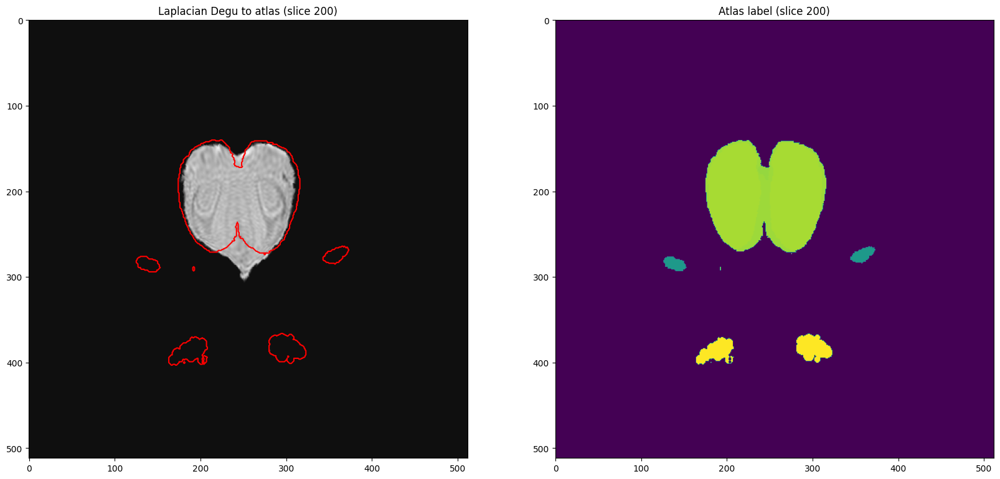

Unique values in atlas_label at slice  250 : [  0.  41.  64.  65.  66.  73.  76.  77. 180. 400. 401. 402. 403. 404.]


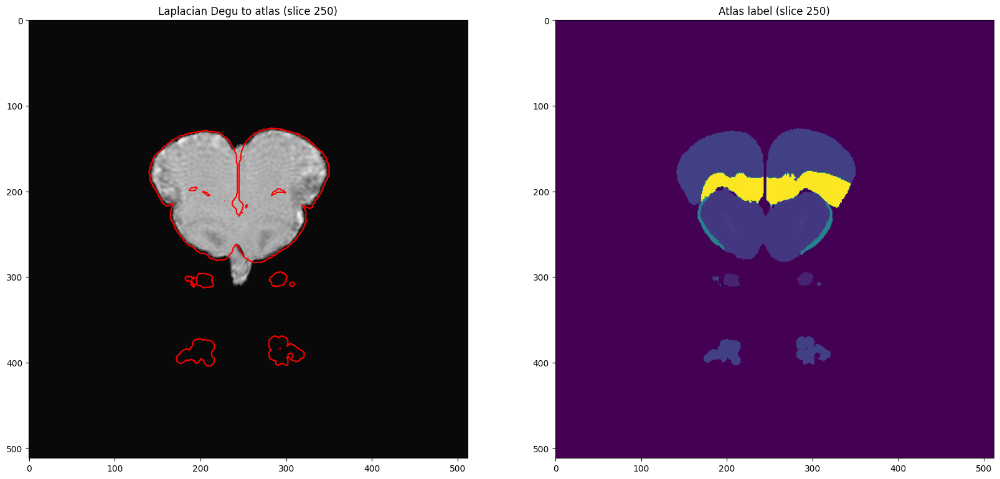

Unique values in atlas_label at slice  300 : [  0.  41.  66.  67.  73.  76.  82. 180. 181. 182. 183. 400. 401. 402.
 404. 405. 406. 407. 408. 409. 410. 412. 413. 500.]


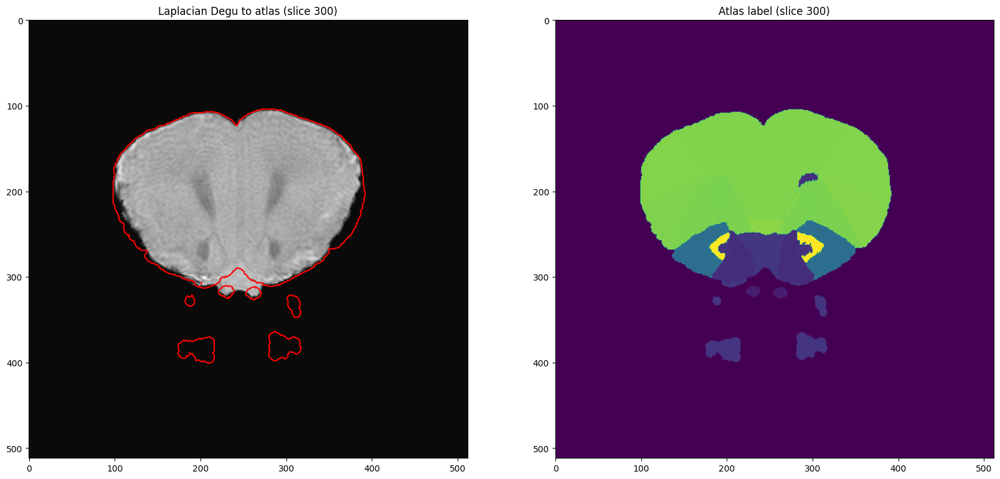

Unique values in atlas_label at slice  350 : [  0.  10.  33.  36.  40.  42.  66.  67.  76.  82. 100. 180. 181. 182.
 183. 184. 192. 193. 197. 406. 408. 409. 410. 411. 412. 413. 414. 416.
 417. 418. 420. 500.]


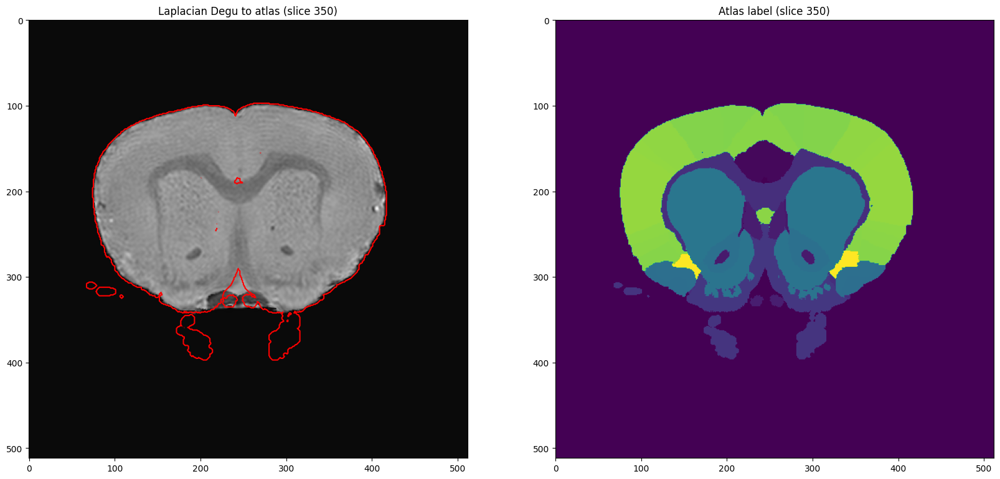

Unique values in atlas_label at slice  400 : [  0.   1.  10.  33.  36.  37.  40.  42.  52.  59.  67.  76.  82.  93.
 180. 181. 182. 183. 193. 197. 198. 199. 406. 408. 411. 412. 414. 416.
 417. 418. 420. 422. 423. 424. 500. 501.]


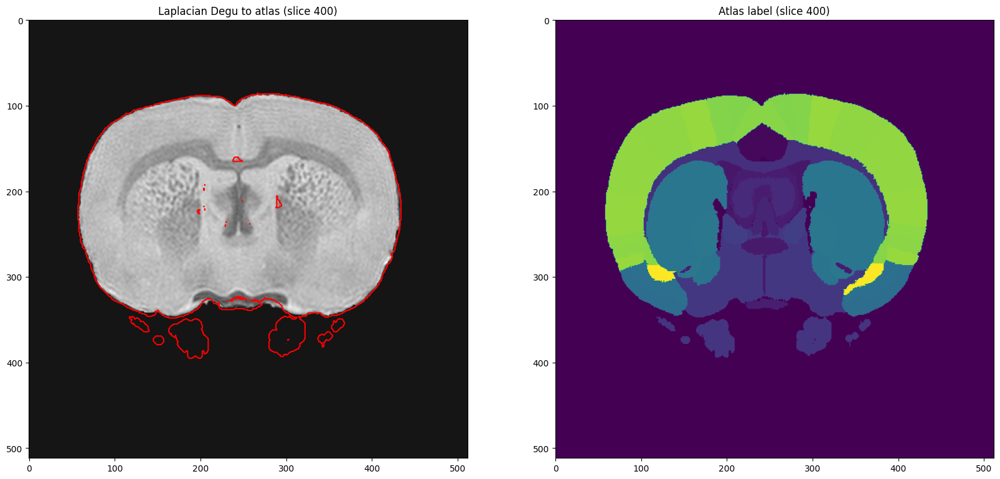

Unique values in atlas_label at slice  450 : [  0.   1.  32.  33.  34.  42.  48.  52.  53.  54.  59.  61.  62.  67.
  76.  82.  83.  95.  96.  97.  98.  99. 164. 181. 182. 183. 197. 198.
 200. 206. 207. 216. 218. 219. 221. 222. 223. 227. 228. 229. 230. 231.
 232. 233. 235. 236. 238. 240. 242. 246. 247. 248. 249. 257. 260. 294.
 406. 408. 414. 416. 418. 422. 424. 425. 427. 429. 430. 500. 501. 502.]


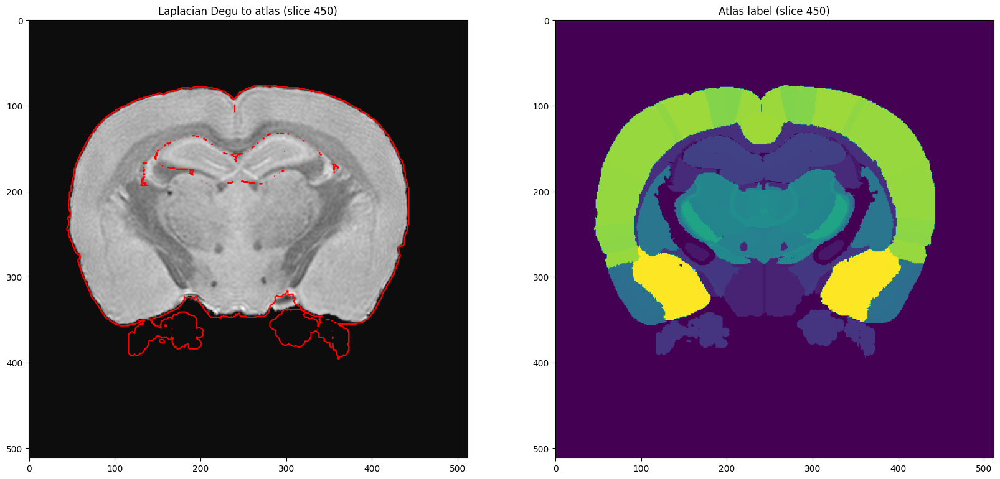

Unique values in atlas_label at slice  500 : [  0.   1.  33.  34.  42.  47.  48.  51.  53.  55.  59.  60.  63.  67.
  68.  76.  80.  83.  94.  95.  96.  97.  98.  99. 100. 112. 113. 115.
 150. 151. 152. 153. 157. 181. 182. 183. 187. 188. 196. 204. 205. 210.
 227. 230. 239. 249. 270. 272. 278. 280. 281. 282. 283. 285. 286. 287.
 290. 294. 427. 429. 430. 436. 442. 443. 444. 448. 500. 501.]


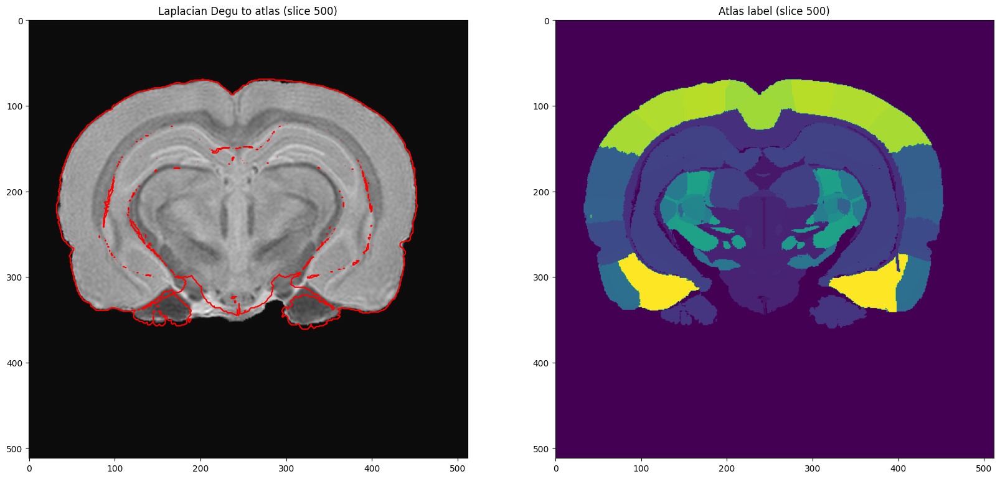

Unique values in atlas_label at slice  550 : [  0.   1.  33.  47.  50.  51.  55.  67.  71.  76.  95.  96.  98. 100.
 109. 110. 112. 113. 114. 115. 146. 150. 151. 152. 153. 187. 188. 189.
 295. 297. 298. 299. 427. 430. 442. 443. 444. 448.]


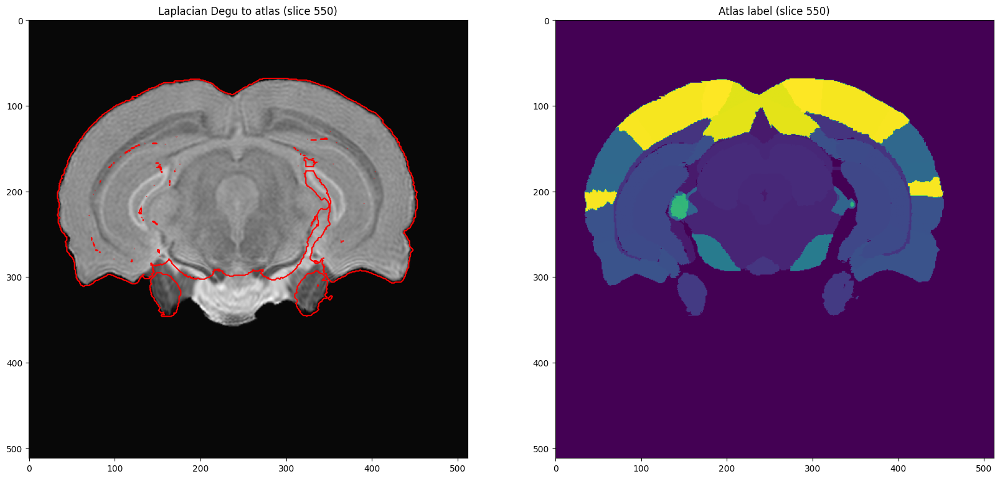

Unique values in atlas_label at slice  600 : [  0.   1.  33.  43.  47.  51.  58.  69.  76.  78.  79. 108. 110. 114.
 115. 137. 138. 139. 140. 141. 142. 143. 145. 163. 427. 430. 442. 443.
 444. 448.]


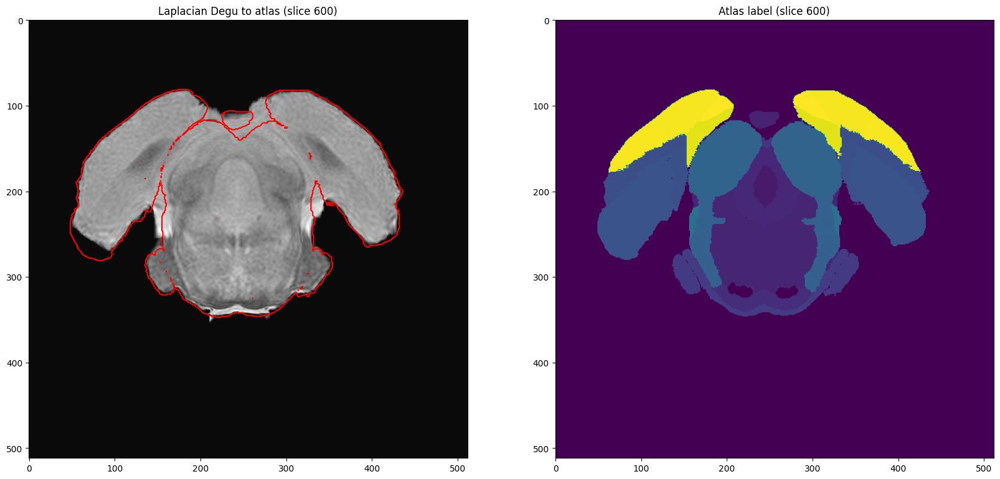

Unique values in atlas_label at slice  650 : [  0.   1.   4.   5.  35.  47.  56.  57.  76. 119. 120. 121. 122. 123.
 125. 130. 131. 132. 133. 134. 135. 136. 158. 160. 162.]


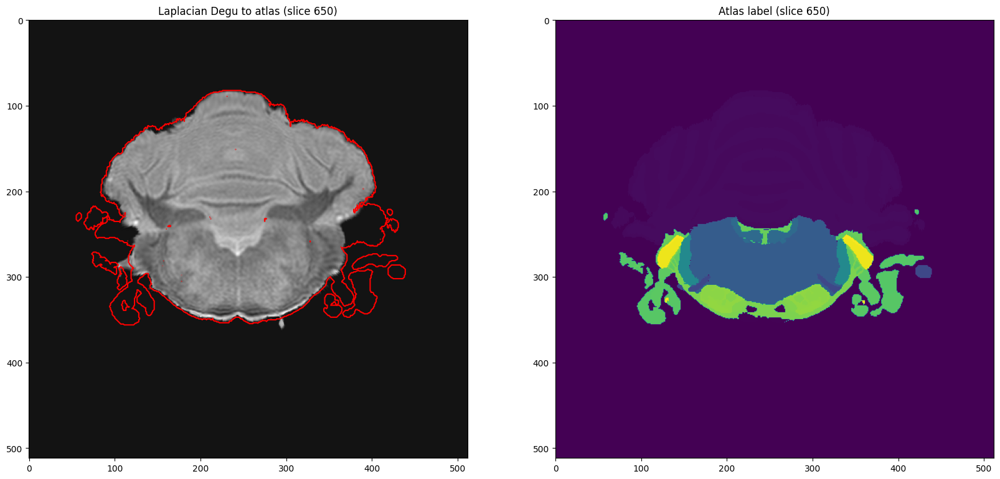

Unique values in atlas_label at slice  700 : [  0.   1.   4.   5.   7.  47.  56.  75.  76.  96. 119. 125. 126. 127.
 128. 129. 159.]


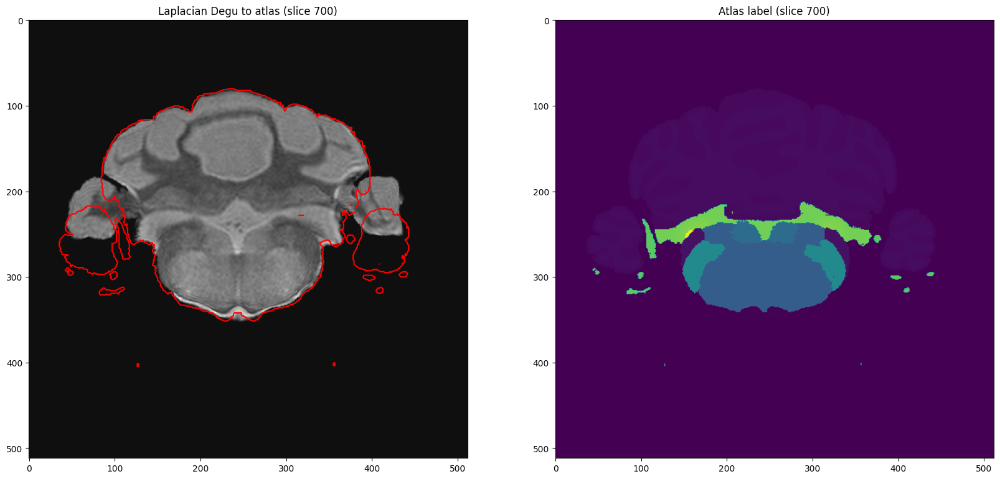

Unique values in atlas_label at slice  750 : [  0.   1.   4.   5.   7.  47.  56.  74.  75.  76.  84. 125.]


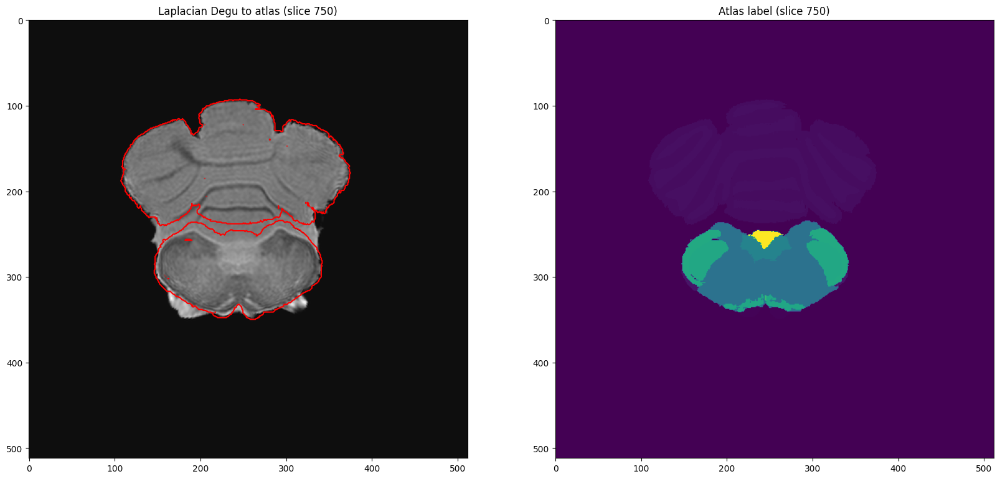

Unique values in atlas_label at slice  800 : [ 0.  1. 47. 56. 70. 75. 76. 85.]


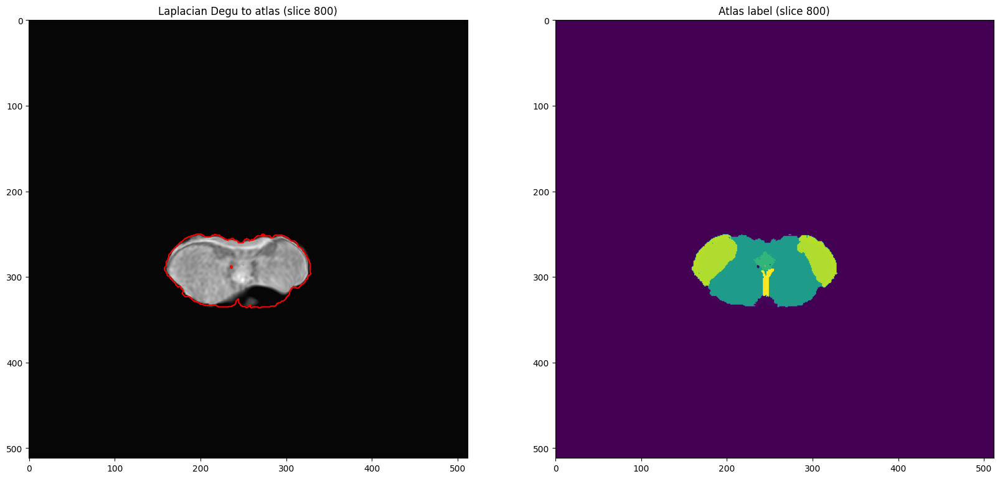

Unique values in atlas_label at slice  850 : [ 0. 45. 56. 70.]


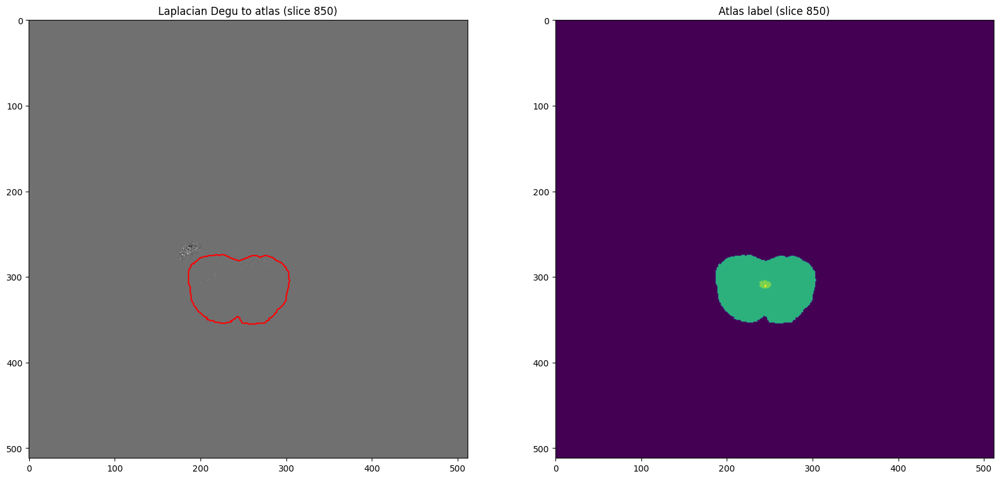

Unique values in atlas_label at slice  900 : [ 0. 45. 56. 70.]


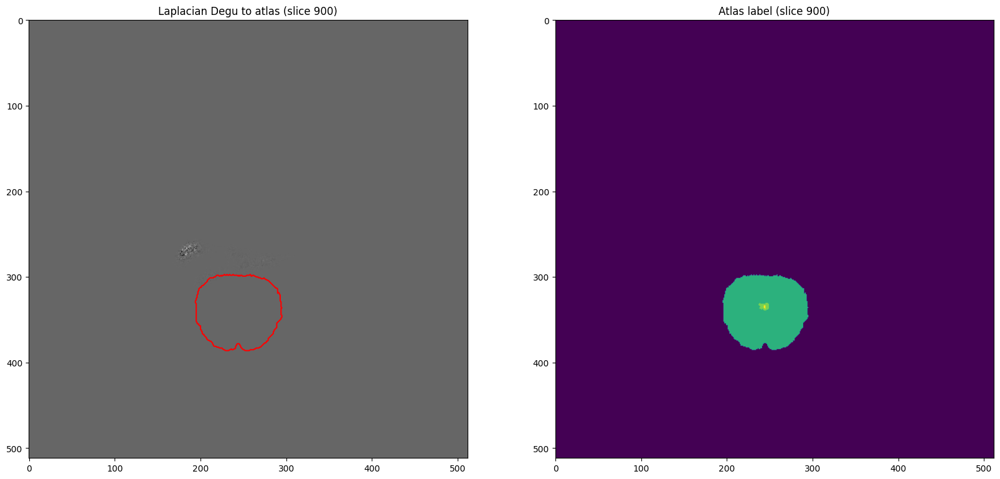

Unique values in atlas_label at slice  950 : [ 0. 45. 56. 70.]


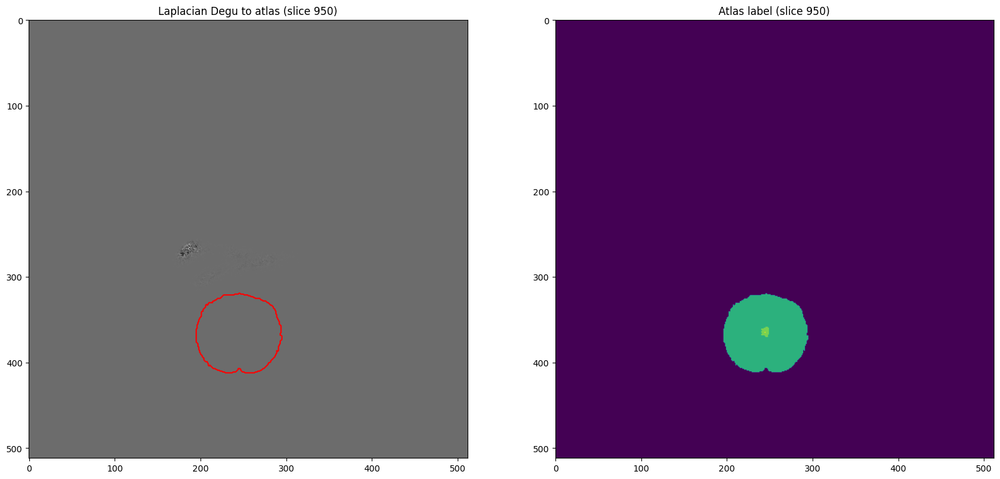

Unique values in atlas_label at slice  1000 : [ 0. 45. 56.]


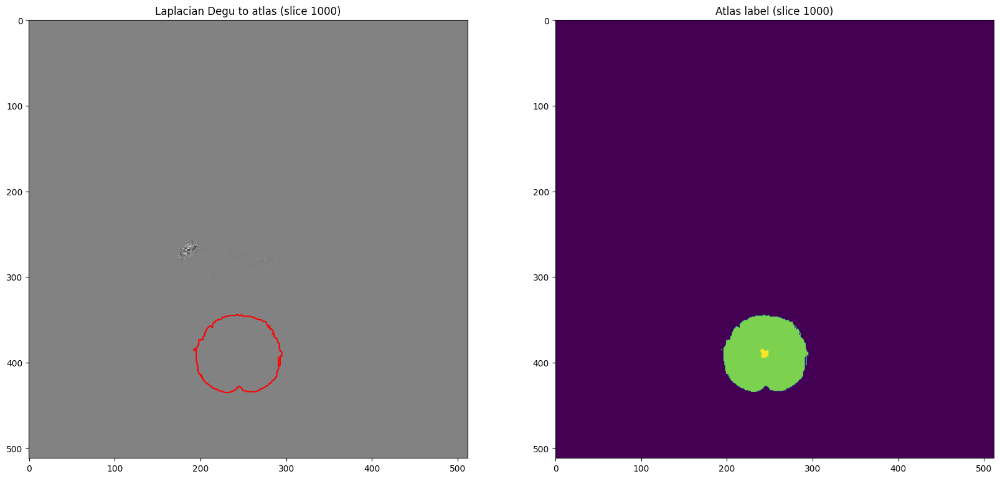

In [ ]:
for i in range(0, laplacian_degu2atlas.shape[0], 50):
    #show_slice(laplacian_atlas2degu, i, title=f"Laplacian Atlas to degu (slice {i})")
    print("Unique values in atlas_label at slice ", i, ":", np.unique(atlas_label[i, :, :]))
    show_2_slices(laplacian_degu2atlas, i, atlas_label, atlas_label, i,
                  cmap1="gray", cmap2="viridis",
                  title1=f"Laplacian Degu to atlas (slice {i})",
                  title2=f"Atlas label (slice {i})")

### Get subset of segmentation

Unique values in atlas_label at slice  450 : [  0.   1.  32.  33.  34.  42.  48.  52.  53.  54.  59.  61.  62.  67.
  76.  82.  83.  95.  96.  97.  98.  99. 164. 181. 182. 183. 197. 198.
 200. 206. 207. 216. 218. 219. 221. 222. 223. 227. 228. 229. 230. 231.
 232. 233. 235. 236. 238. 240. 242. 246. 247. 248. 249. 257. 260. 294.
 406. 408. 414. 416. 418. 422. 424. 425. 427. 429. 430. 500. 501. 502.]


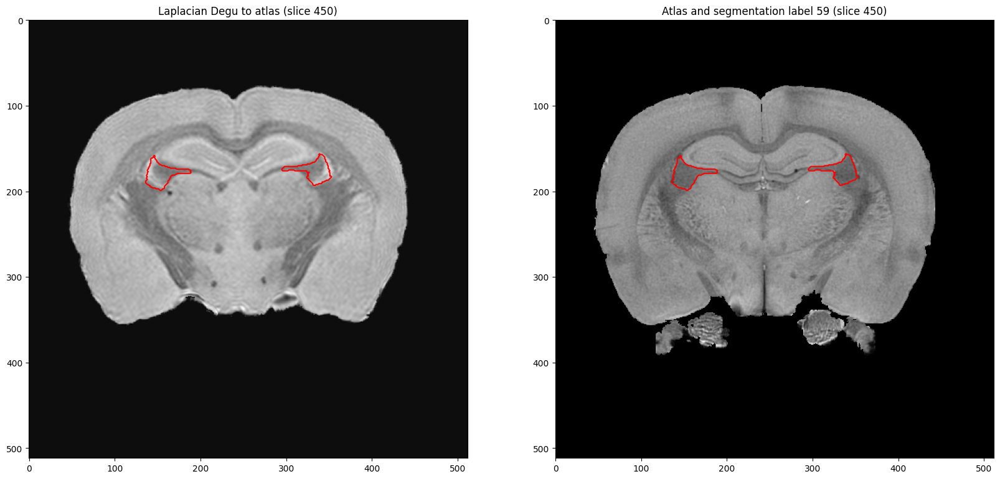

In [ ]:
i = 450
segmentation_index = 59 # 42, 59, 67, 95, 181

print("Unique values in atlas_label at slice ", i, ":", np.unique(atlas_label[i, :, :]))
slice_label = atlas_label.copy()
slice_label[slice_label != segmentation_index] = 0

show_2_slices(laplacian_degu2atlas, i, slice_label, atlas_data, i,
                cmap1="gray", cmap2="gray",
                segmentation2=slice_label,
                title1=f"Laplacian Degu to atlas (slice {i})",
                title2=f"Atlas and segmentation label {segmentation_index} (slice {i})")

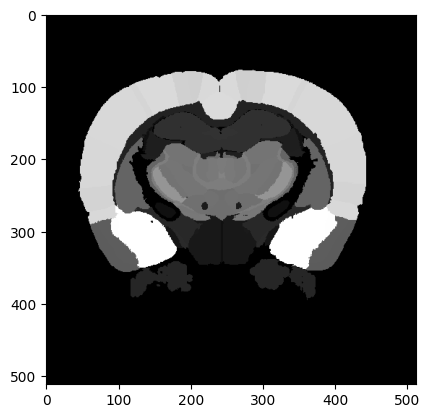

In [ ]:
plt.imshow(atlas_label[i, :, :], cmap='gray')

#### Color segmentations

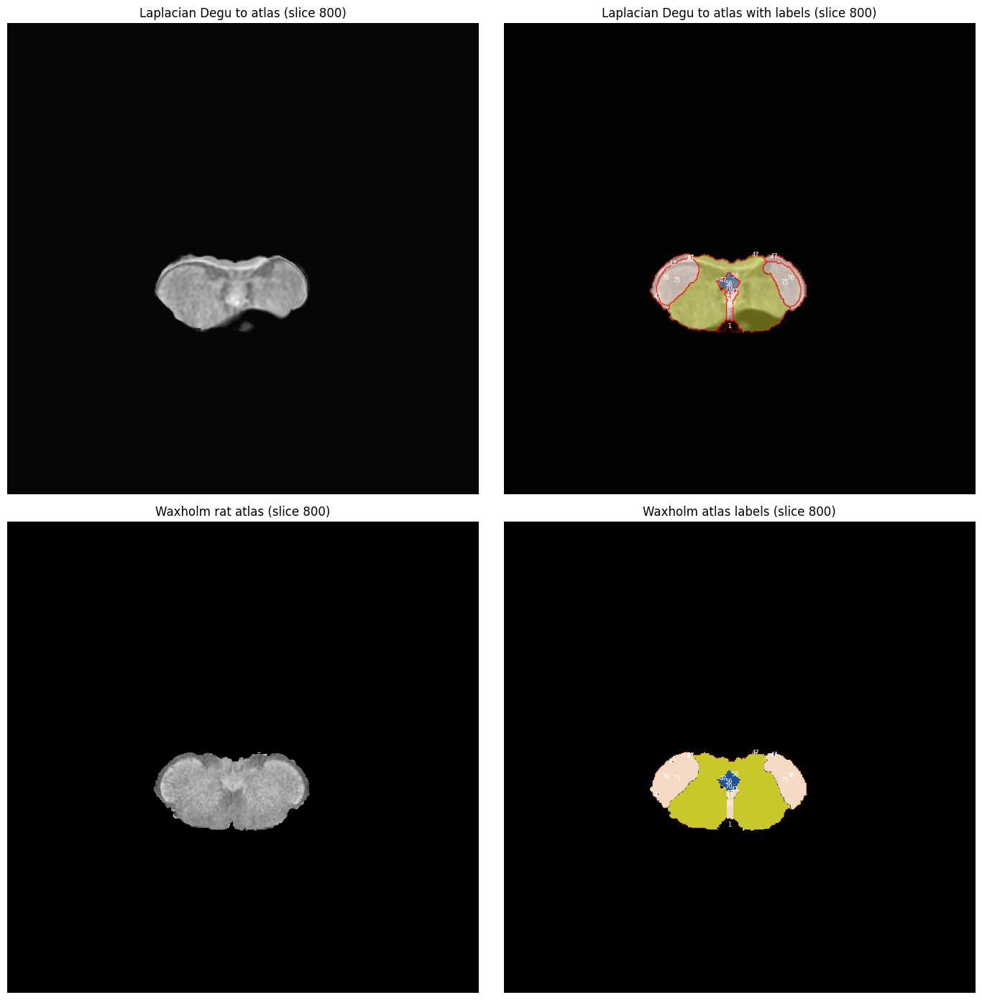

In [27]:
from matplotlib.colors import ListedColormap
from scipy.ndimage import center_of_mass, label

idx = 800  # Try 450 and 500

# Generate a custom colormap with enough unique colors
unique_values = np.unique(atlas_label[idx, :, :])
num_labels = len(unique_values)
np.random.seed(142)  # For reproducibility
colors = np.random.rand(num_labels - 1, 3)  # Generate random RGB colors
colors = np.vstack([[0, 0, 0], colors])  # Ensure 0 is always black
custom_cmap = ListedColormap(colors)

# Registration output without overlay
f, ax = plt.subplots(2, 2, figsize=(14, 14))
ax[0][0].imshow(laplacian_degu2atlas[idx, :, :], cmap='gray')
ax[0][0].set_title(f"Laplacian Degu to atlas (slice {idx})")
ax[0][0].set_axis_off()

# Registration output with overlay
ax[0][1].imshow(laplacian_degu2atlas[idx, :, :], cmap='gray')
# Overlay boundaries for each unique value in atlas_label
for value in unique_values:
    if value == 0:  # Skip background
        continue
    ax[0][1].contour(atlas_label[idx, :, :] == value, 
                  levels=[0.5], colors='r', linewidths=1, alpha=0.5)
    
    # Compute the center of mass for the current label
    mask = atlas_label[idx, :, :] == value
    # Label connected components in the mask
    labeled_components, num_components = label(mask)

    # Compute the center of mass for each connected component
    for component_idx in range(1, num_components + 1):
        component_mask = labeled_components == component_idx
        center = center_of_mass(component_mask)

        # Add the label index at the center of the region
        ax[0][1].text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')
        ax[1][1].text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')


    
ax[0][1].imshow(atlas_label[idx, :, :], cmap=custom_cmap, alpha=0.5)  # Use a colormap like 'tab20'
ax[0][1].set_title(f"Laplacian Degu to atlas with labels (slice {idx})")
ax[0][1].set_axis_off()

# Rat atlas slice
ax[1][0].imshow(atlas_data[idx, :, :], cmap='gray')
ax[1][0].set_title(f"Waxholm rat atlas (slice {idx})")
ax[1][0].set_axis_off()

# Rat atlas labels
ax[1][1].imshow(atlas_label[idx, :, :], cmap=custom_cmap, alpha=1)
ax[1][1].set_title(f"Waxholm atlas labels (slice {idx})")
ax[1][1].set_axis_off()

plt.tight_layout()
plt.show()
f.clear()
plt.close(f)

## Measure mutual information score

In [21]:
def getMutualInformation(fdata, mdata):
    """
    Wrapper function to calculate Mutual information between two numpy arrays usint SITK mutual information
    
    Parameters
    ------------
    fdata: np array
    mdata: np array
    """
    def rescaleMaxTo255(data):
        """
        Thresholds  and converts data to UINT8
        """
        maxVal  = np.percentile(data, 99)
        data[data > maxVal ] = maxVal
        data = data*255 /maxVal
        return data

    mdata[mdata<0] =0
    m8 = rescaleMaxTo255(mdata)
    f8 = rescaleMaxTo255(fdata)
    fImage = sitk.GetImageFromArray(f8.astype(float))
    mImage = sitk.GetImageFromArray(m8.astype(float))
    registration_method = sitk.ImageRegistrationMethod()
    registration_method.SetMetricAsMattesMutualInformation()
    return registration_method.MetricEvaluate(fImage, mImage)

In [22]:
ants_degu2atlas_mutual = getMutualInformation(atlas_data, degu2atlas)
ants_atlas2degu_mutual = getMutualInformation(data, atlas2degu)
degu2atlas_mutual = getMutualInformation(atlas_data, laplacian_degu2atlas)
atlas2degu_mutual = getMutualInformation(data, laplacian_atlas2degu)

print("Mutual information between atlas and ANTs Degu to atlas: ", ants_degu2atlas_mutual)
print("Mutual information between Degu and ANTs Atlas to Degu: ", ants_atlas2degu_mutual)

print("\nMutual information between atlas and ANTs + Laplacian Degu to atlas: ", degu2atlas_mutual)
print("Mutual information between Degu and ANTs + Laplacian atlas to Degu: ", atlas2degu_mutual)

Mutual information between atlas and ANTs Degu to atlas:  -0.3387346827138912
Mutual information between Degu and ANTs Atlas to Degu:  -0.43008746285591876

Mutual information between atlas and ANTs + Laplacian Degu to atlas:  -0.3437733437004502
Mutual information between Degu and ANTs + Laplacian atlas to Degu:  -0.43340214193186793


In [ ]:
def getTestSamples(data, template= None, n=8,  testSamples=[],axis =0 , saveprefix="",):
    """
    Draws Contours extracted from moving onto fixed samples
    """
    assert n>1
    if type(data) == str:
        dataImage = nib.load(data)
        data = dataImage.get_fdata()
    data[data<0] =0
    data = convertToUint8(data)
    labelled_samples =[] 
    if len(testSamples)==0:
        testSamples = np.arange(0, data.shape[0], data.shape[0]/n)[1:]
        testSamples = testSamples.astype(int)
    if template is None:
        for testSample in testSamples:
            labelled_samples.append(data[testSample] )
            if saveprefix != "":
                skimage.io.imsave("tests/{}_{}.jpg".format(saveprefix, testSample),data[testSample] )
        return labelled_samples
    if type(template) == str:
        templateImage = nib.load(template)
        template = templateImage.get_fdata()
        template = convertToUint8(template)
    labelled_samples =[]    
    for testSample in testSamples:
        contouredImage  = labelWithAnnotation(np.take(data, testSample, axis=axis),np.take(template, testSample, axis=axis))
        labelled_samples.append(contouredImage)
        
        if saveprefix != "":
            skimage.io.imsave("tests/{}_{}.jpg".format(saveprefix, testSample),contouredImage )
    return labelled_samples

# End

In [ ]:
import shutil
import os
"""
# Save forward transforms
for i, fwd_transform in enumerate(result['fwdtransforms']):
    shutil.copy(fwd_transform, f"output/registered/transforms/degu_191_fwd_{os.path.basename(fwd_transform)}")

# Save inverse transforms
for i, inv_transform in enumerate(result['invtransforms']):
    shutil.copy(inv_transform, f"output/registered/transforms/degu_191_inv_{os.path.basename(inv_transform)}")

print("Transforms copied successfully.")
"""

FileNotFoundError: [Errno 2] No such file or directory: 'output/registered/transforms/degu_191_fwd_tmp2lkccnu21Warp.nii.gz'

In [ ]:
# Transforms to move from moving to fixed image
print(result['fwdtransforms'])
# Transforms to move from fixed to moving image
print(result['invtransforms'])

['/tmp/tmpao0xre8g1Warp.nii.gz', '/tmp/tmpao0xre8g0GenericAffine.mat']
['/tmp/tmpao0xre8g0GenericAffine.mat', '/tmp/tmpao0xre8g1InverseWarp.nii.gz']


Result volume shape: (512, 512, 512)


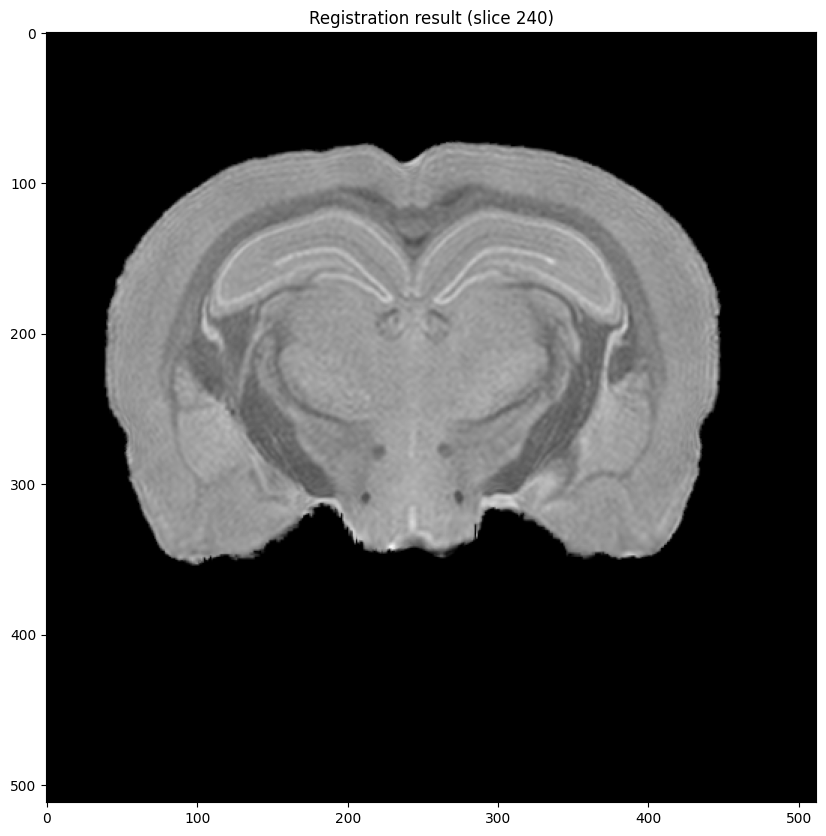

In [ ]:
IDX = 240
output_path = "output/registered/ants_degu_191_compressed.nii.gz"

# View the result
result_data = nib.load(output_path).get_fdata()
print("Result volume shape:", result_data.shape)

# Registered result
f = plt.figure(figsize=(10, 10))
plt.imshow(result_data[IDX, :, :], cmap='gray')
plt.title(f"Registration result (slice {IDX})")
plt.show()
f.clear()
plt.close(f)

Original shape: (592, 288, 464)
Registered shape: (592, 288, 464)


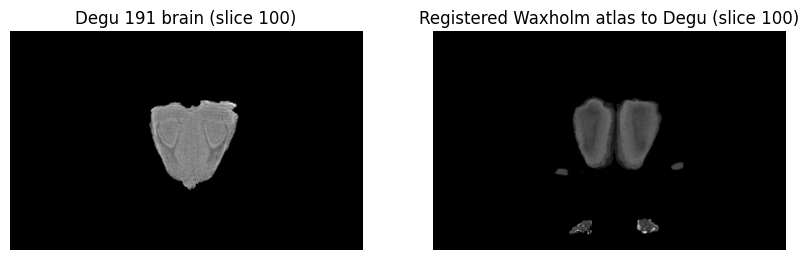

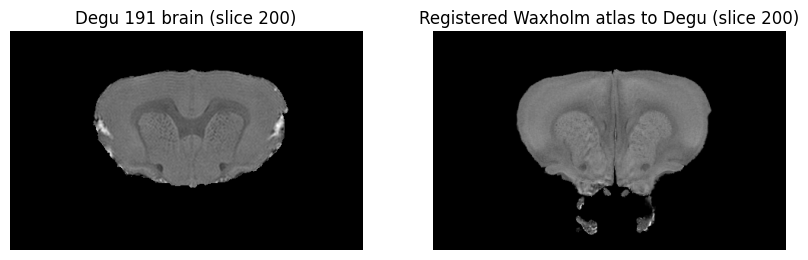

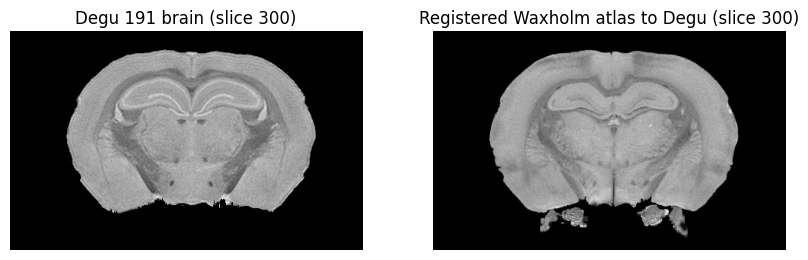

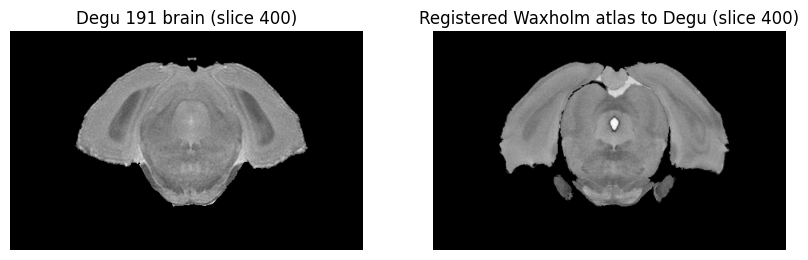

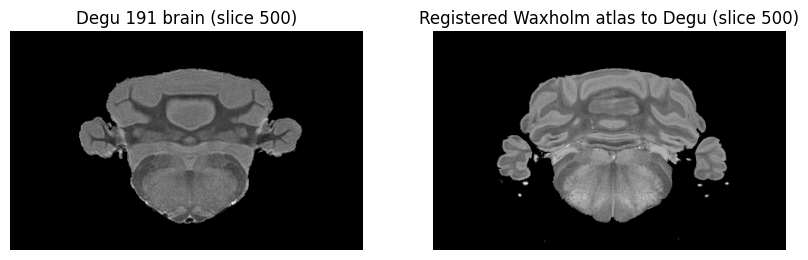

In [ ]:
import nibabel as nib 
import matplotlib.pyplot as plt

IDX = 400

output_path = "output/registered/ants_atlas_to_degu_191.nii.gz"
# View the result
result_data = nib.load(output_path).get_fdata()

print("Original shape:", data.shape)
print("Registered shape:", result_data.shape)

def show_reg_plots(idx, data, result_data):
    f, ax = plt.subplots(1, 2, figsize=(10, 10))
    # moving_image
    ax[0].imshow(data[idx, :, :], cmap='gray')
    ax[0].set_title(f"Degu 191 brain (slice {idx})")
    ax[0].set_axis_off()
    ax[1].imshow(result_data[idx, :, :], cmap='gray')
    ax[1].set_title(f"Registered Waxholm atlas to Degu (slice {idx})")
    ax[1].set_axis_off()
    plt.show()
    f.clear()
    plt.close(f)
    
show_reg_plots(100, data, result_data)
show_reg_plots(200, data, result_data)
show_reg_plots(300, data, result_data)
show_reg_plots(400, data, result_data)
show_reg_plots(500, data, result_data)

## End

In [ ]:
print("Laplacian Refinement")
deformationField  = rg.sliceToSlice3DLaplacian(fixedImagePath , movingImagePath , axis =0 )
np.save(os.path.join(outputDir,"deformation3d.npy"), deformationField)
transformedData   = rg.applyDeformationField(movingImagePath , deformationField)
refinedResultPath = os.path.join(outputDir, "elastixRefined.nii.gz")
create_nifti_image(transformedData, 2.5, refinedResultPath, 1/2)

print("Final registered image stored at {}".format(refinedResultPath))

In [ ]:
print("START")
template_path = "processed/smartspim_25um_cropped.nii"
input_path0 = "240913_newscan/240913_new_scan_25downsampled_ch0.nii.gz"
input_path1 = "240913_newscan/240913_new_scan_25downsampled_ch1.nii.gz"
input_path2 = "240913_newscan/240913_new_scan_25downsampled_ch2.nii.gz"

output_path0 = "output/ch0_registered.nii.gz"
output_path1 = "output/ch1_registered.nii.gz"
output_path2 = "output/ch2_registered.nii.gz"

print("READING")

moving_image0 = nib.load(input_path0).get_fdata()
moving_image1 = nib.load(input_path1).get_fdata()
moving_image2 = nib.load(input_path2).get_fdata()
fixed_image = nib.load(template_path).get_fdata()


print("PROCESSING")
moving_image0 = np.rot90(moving_image0, k=1, axes=(1, 2))  # Ch0
moving_image0 = np.flip(moving_image0, axis=0)
moving_image1 = np.rot90(moving_image1, k=1, axes=(1, 2))  # Ch1
moving_image1 = np.flip(moving_image1, axis=0)
moving_image2 = np.rot90(moving_image2, k=1, axes=(1, 2))  # Ch2
moving_image2 = np.flip(moving_image2, axis=0)
fixed_image = np.moveaxis(fixed_image, -1, 0)



## Visualize

## Meeting notes

1. Paper with Eric

2. Dataset from Max 

3. Laplacian 
What is the size of the correspondence field size such that it can influence negative Jacobian? How do we pick the neighborhood size from there? 
Prediction: pattern matching with LUT values 
Prove this is a valid approach. 
Validity of lookup table. How do we prove that lookup table predicts negative and positive Jacobians correctly? 
Get a % accuracy rate on real data. Run comparison on real data and see how accurate the LUT is for all pairs. 

First, identify the negative Jacobian points


Next, how do we resolve negative Jacobian?
* Bin it 
* Remove it 
* Compute average

Prove that 
1. it solves the problem
2. It doesn't overdo things (false positives)
3. Why is it better? t does it efficiently. There is no other approach that can do it more efficiently than this. 
Advantages: highly parallelizable. 
Pick every two pairs of correspondence, send it to comparison machine, and it will tell you which ones are negative and which ones are positive.

Graduation plan: 
Send current list of publications and accepted / pending 
Future plan for next two three weeks that will result in a publication. 